# Output files will be here

In [27]:
import os
output_path = "/Users/Jayee/Library/CloudStorage/OneDrive-UW-Madison/PhD(my_PC)/PhD(output_files)/\
Engineering_projects/Indentation_tests/240715_preliminary_analysis_4_2d_GPR_all_data"

## Loading and saving the required data
We have data from the onedrive folder. So we first make a replica of the required data and save it in the folder where our code is.

In [26]:
import numpy as np
import pandas as pd

path = "/Users/Jayee/Library/CloudStorage/OneDrive-UW-Madison/PhD(Data)/Nanoindentation data-selected/Spherical Indentation data/Sph Indentation properties vs block parameters.xlsx"
required_columns = [0,1,2,3,4]
required_rows = [i for i in np.arange(18)]
df = pd.read_excel(path,sheet_name = 0, usecols=required_columns, nrows=19)
df.to_excel("sp_indentation_data.xlsx",index=False)

## Loading the saved data 
We have made an outputfile containing the data and saved it in the current folder. Now we want to load this data into an array called data_with_testnames.

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.gaussian_process import GaussianProcessRegressor as GPR
from sklearn.gaussian_process.kernels import WhiteKernel, RBF

file_name = "sp_indentation_data.xlsx"
new_path = !pwd 
new_path= new_path[0]
new_path = os.path.join(new_path,file_name)

df = pd.read_excel(file_name)
data_with_testnames = df[1:].values

There are 3 ategories. red, green, blue.
The first 7 data are in category red.
The next 4 are in category green.
The last 6 are in category blue. Lets seggregate them right away from here.

In [2]:
data_with_testnames_r = data_with_testnames[0:7,:] # from first to 7th data point.
data_with_testnames_g = data_with_testnames[7:11,:]
data_with_testnamesb = data_with_testnames[11:,:]

The above data_with_testnames is a 2d array. The columns represent the following.
- cloumn 0 : test name
- column 1 : Linear strain hardening co-efficient (K)
- column 2 : indentation yield strength, (Y,GPa)
- column 3 : shortest distance from the grain boundary (x,micro meters)
- column 4 : Misorientation angle (o,degrees)

So, lets create another variable called "data" with no test names in it.

In [3]:
# All data combined
data = data_with_testnames[:,1:]
K = data[:,0]
Y = data[:,1]
x = data[:,2]
o = data[:,3]

# Only the red data
datar = data_with_testnames_r[:,1:]
Kr = datar[:,0]
Yr = datar[:,1]
xr = datar[:,2]
or_ = datar[:,3]

# Only the green data
datag = data_with_testnames_g[:,1:]
Kg = datag[:,0]
Yg = datag[:,1]
xg = datag[:,2]
og = datag[:,3]

# Only the blue data
datab = data_with_testnamesb[:,1:]
Kb = datab[:,0]
Yb = datab[:,1]
xb = datab[:,2]
ob = datab[:,3]

The above "data" variable is a 2d array. The columns represent the following.
- column 0 : Linear strain hardening co-efficient(Y)
- column 1 : indentation yield strength, (Y,GPa)
- column 2 : shortest distance from the grain boundary (x,micro meters)
- column 3 : Misorientation angle (o,degrees)

We will develop a cleaner code from now on.
Let us present all the data in dictionary format. Doing it in object format is good, But Currently I do not possess the skill.

Let us make a dictionary of the data.

In [4]:
data_dict = {"colors":["Red","Green","Blue"],
             "names":["K","Y","x","o"],
             "shapes":["^","v",1,"o"],
            "K":[Kr,Kg,Kb],
            "Y":[Yr,Yg,Yb],
            "x":[xr,xg,xb],
            "o":[or_,og,ob]}

# Visualizing the data

In [28]:
# A function for 3d plot
def my_3d_plot(data_dict):
    for __ in range(3):   
        for _ in range(2):
            fig = plt.figure(figsize=[10,10]) 
            axs= fig.add_subplot(111,projection="3d")
            x_latex = r"$\mathbf{x}$"
            theta_latex = r"$\mathbf{\theta}$"
            _axis = rf"$\mathbf{{{data_dict['names'][_]}}}$"

            axs.set_xlabel(f"{x_latex}- axis", fontweight="bold",fontsize=12)
            axs.set_ylabel(f"{theta_latex} - axis", fontweight = "bold", fontsize=12)
            axs.set_zlabel(f"{_axis} - axis", fontweight="bold", fontsize=12)
            axs.set_title(f"Variation of {_axis}  with respect to {x_latex} and {theta_latex} for group {data_dict['colors'][__]}"
                          ,fontweight="bold",
                          fontsize=14)
            axs.tick_params(labelsize=10)
            scatter = axs.scatter(data_dict["x"][__],data_dict["o"][__],data_dict[data_dict["names"][_]][__],
                                  c= data_dict[data_dict["names"][_]][__], 
                                  marker = data_dict["shapes"][_], edgecolor="k",linewidth=2,s=100,
                                  cmap= f"{data_dict['colors'][__]}s",label= f"{data_dict['colors'][__]} data",
                                 )
            for i, (x, o, K) in enumerate(zip(data_dict["x"][__],
                                              data_dict["o"][__],
                                              data_dict[data_dict["names"][_]][__])):
                axs.text(x, o, K, f'  {i}', color=data_dict["colors"][__], fontsize=10, fontweight='bold')
            legend = axs.legend(loc="best",facecolor="pink", edgecolor="black")
            cbar = fig.colorbar(scatter, ax=axs, shrink=0.5, aspect=15)
            cbar.set_label('Color Intensity', fontsize=12, fontweight='bold')
#             # Saving
#             file_name = f"1_data_points_3D_scaled_{data_dict['names'][_]}_{data_dict['colors'][__]}.pdf"
#             file_loc = os.path.join(output_path,file_name)
#             plt.savefig(file_loc)
            

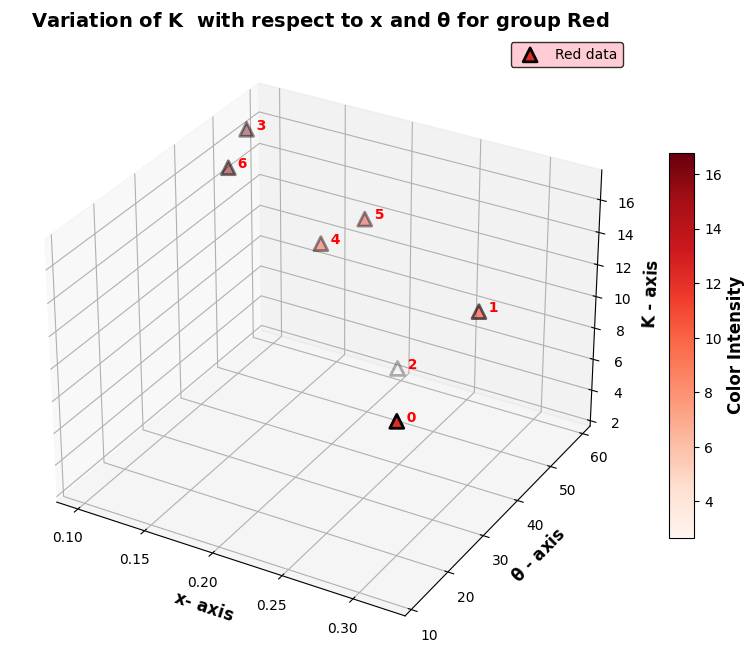

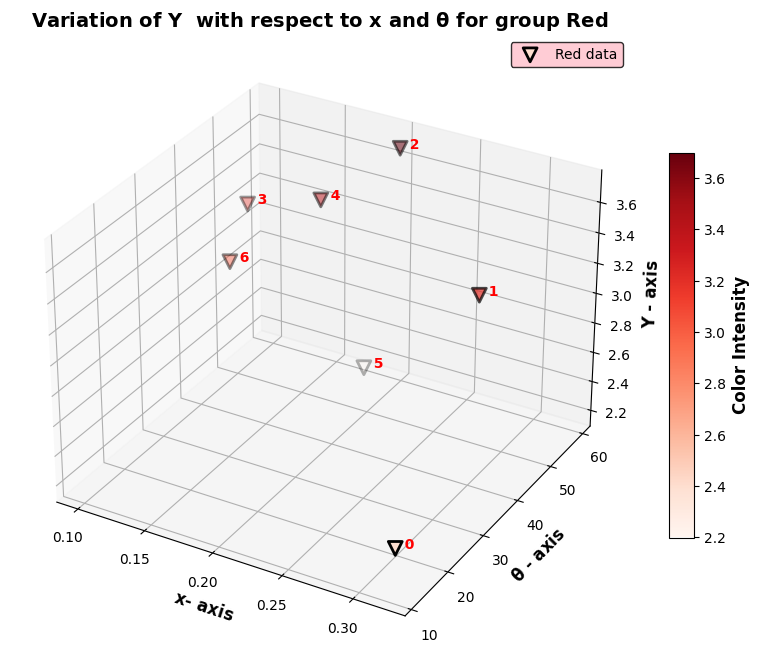

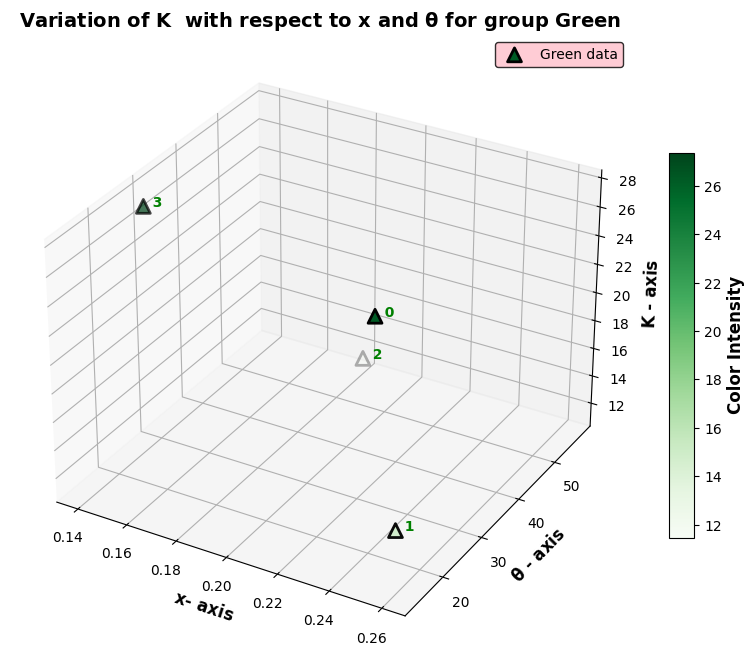

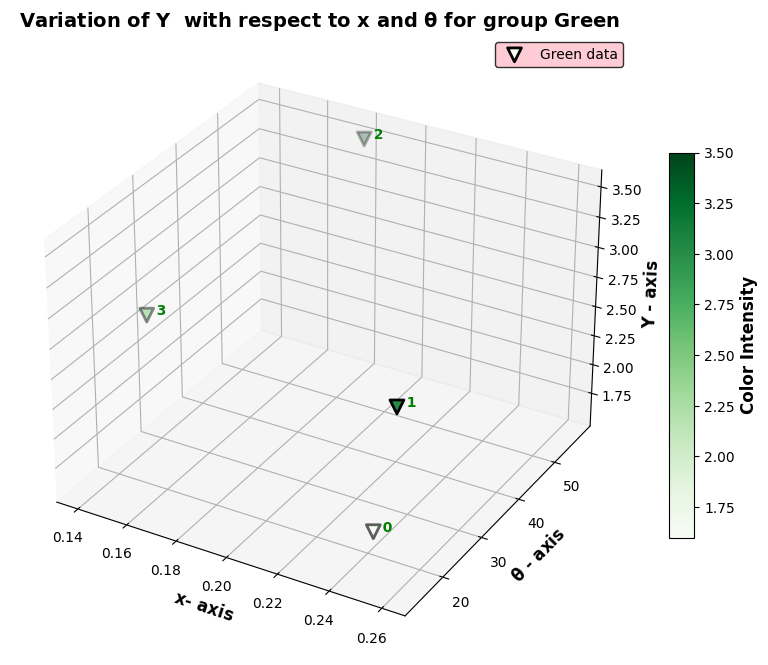

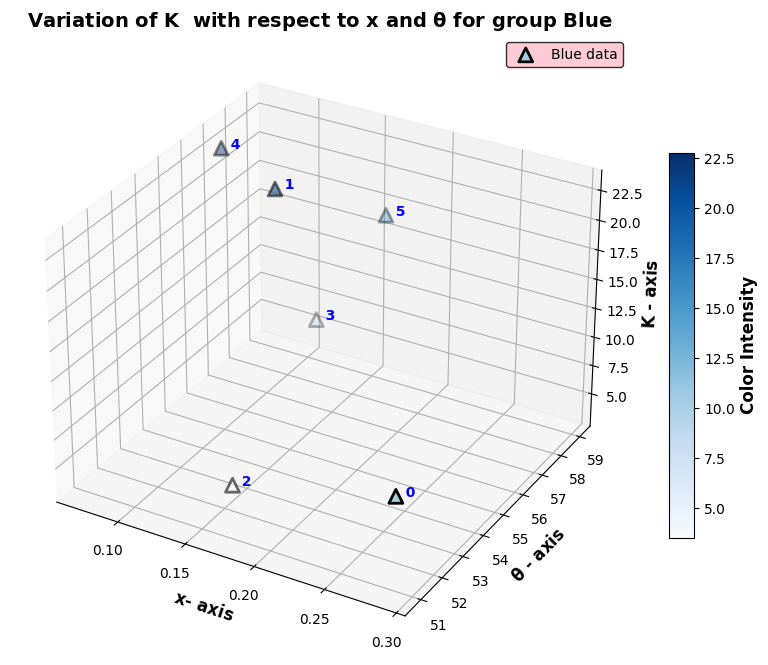

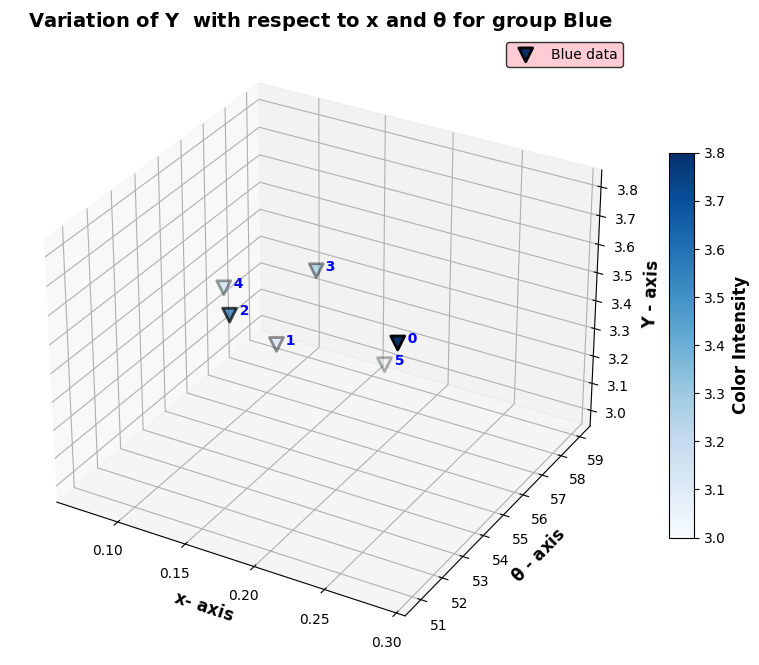

In [5]:
my_3d_plot(data_dict)

# 2D plots

In [32]:
def my_2d_plot(data_dict):
    for _ in range(3):
        for _y_ in [0,1,3]:
            for _x_ in range(2,4):
                fig,axs = plt.subplots(1,1,figsize=[5,5])
                x_latex = rf"$\mathbf{{{data_dict['names'][_x_]}}}$"
                y_latex = rf"$\mathbf{{{data_dict['names'][_y_]}}}$"
                x_name = data_dict['names'][_x_]
                y_name = data_dict['names'][_y_]
                axs.set_title(f"{y_latex} vs {x_latex}", fontweight="bold", fontsize=14)
                axs.set_xlabel(f"{x_latex} - axis", fontweight="bold", fontsize=12)
                axs.set_ylabel(f"{y_latex} - axis", fontweight="bold", fontsize=12)
                axs.scatter(data_dict[x_name][_],
                            data_dict[y_name][_],
                            c=data_dict["colors"][_],
                            marker=data_dict["shapes"][_y_], 
                            edgecolor="k",linewidth=2,s=100,)
                for i, (x, y) in enumerate(zip(data_dict[x_name][_],data_dict[y_name][_],)):
                    axs.text(x, y, f'  {i}', color= data_dict["colors"][_], fontsize=10, fontweight='bold')
                axs.set_facecolor("#f4f4f4")
                axs.grid(True, linestyle="--", alpha = 0.25)
        #axs[i].legend(loc="best",facecolor="pink", edgecolor = "black")
        
#                 # Saving
#                 file_name = f"2_data_points_2D_scaled_{y_name}_vs_{x_name}_{data_dict['colors'][_]}.pdf"
#                 file_loc = os.path.join(output_path,file_name)
#                 plt.savefig(file_loc)
        

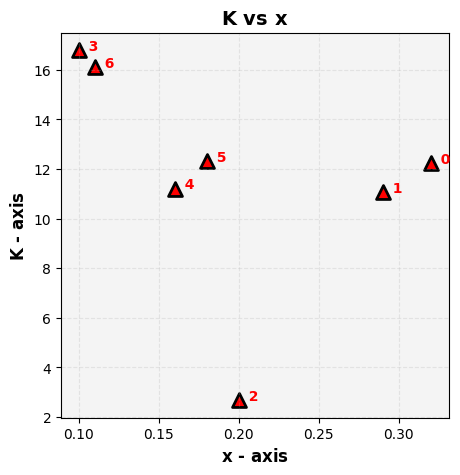

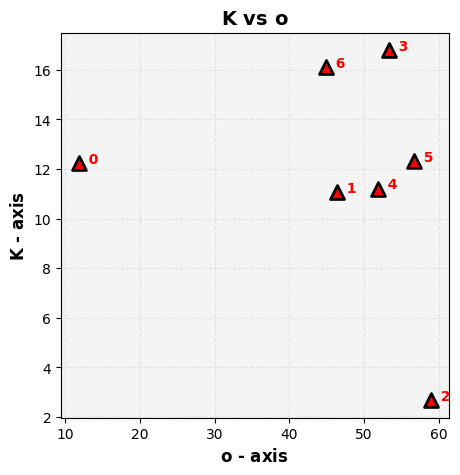

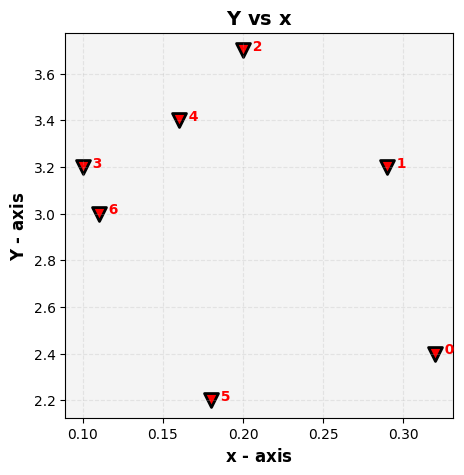

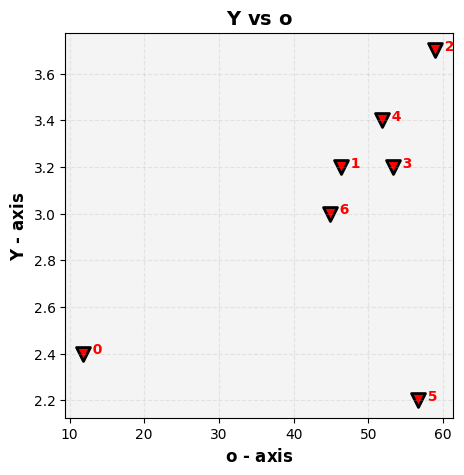

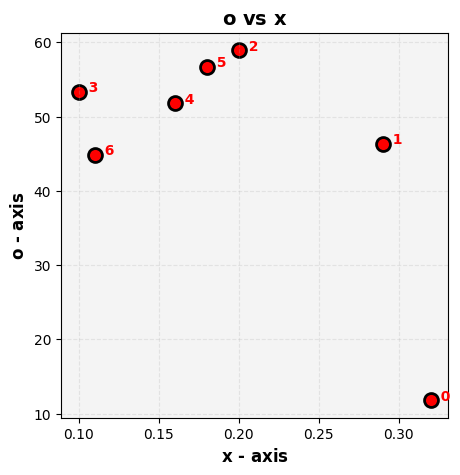

...

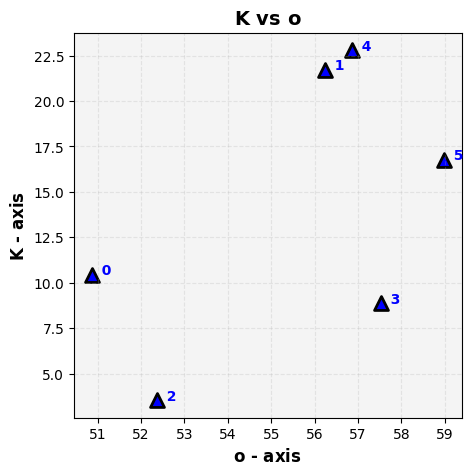

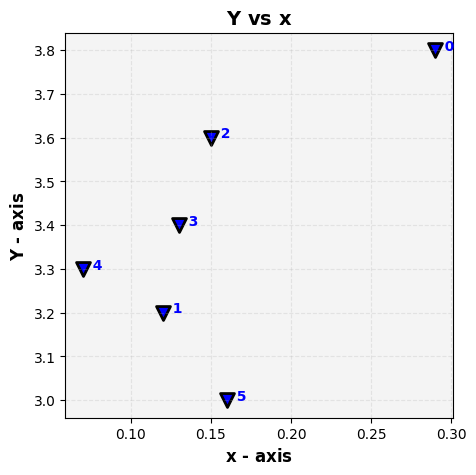

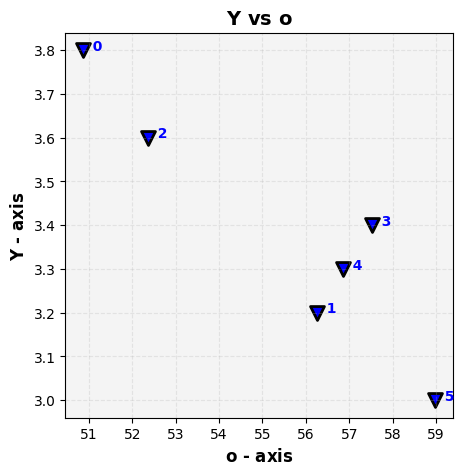

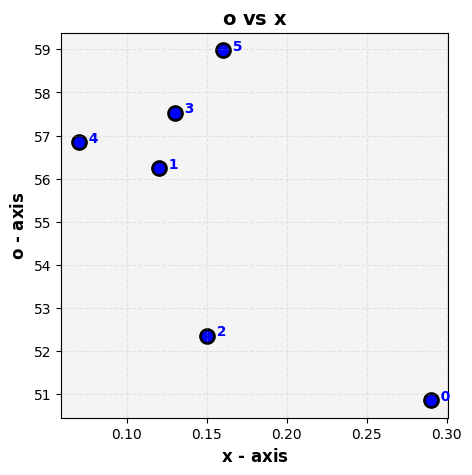

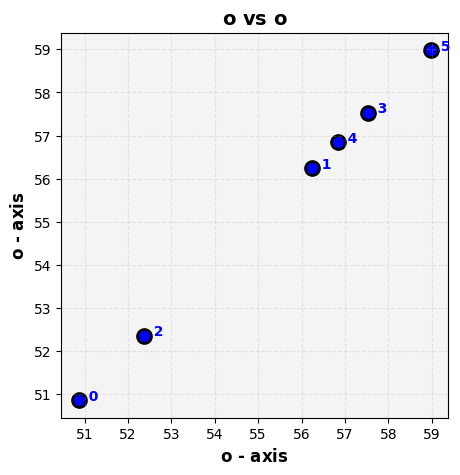

In [6]:
my_2d_plot(data_dict)

# Visaulizing the data


We will consider blue data.

Let us consider point 1 to be unknown. i.e we ae given 5 data points, now we determine using the 5 data points the value at 1. But before that we determine GPR with a particular lengthscale.


In [7]:
xo_train_rgb = [np.hstack([np.array(data_dict['x'][_]).reshape(-1,1),
                             np.array(data_dict['o'][_]).reshape(-1,1)]) for _ in range(3)]
# Defining the scalers
xo_scalers_rgb = [MinMaxScaler() for _ in range(3)]
# Define K and Y scalers.
## Later useful n determining the noise terms
K_scalers_rgb = [MinMaxScaler() for _ in range(3)]
Y_scalers_rgb = [MinMaxScaler() for _ in range(3)]
xo_train_scaled_rgb, K_train_scaled_rgb, Y_train_scaled_rgb  = [[] for _ in range(3)]

# fitting the scalers
for _ in range(3):
    xo_scalers_rgb[_].fit(xo_train_rgb[_])
    xo_train_scaled_rgb.append( xo_scalers_rgb[_].transform(xo_train_rgb[_]) )
    K_scalers_rgb[_].fit(data_dict["K"][_].reshape(-1,1))
    K_train_scaled_rgb.append(K_scalers_rgb[_].transform(data_dict["K"][_].reshape(-1,1)))
    Y_scalers_rgb[_].fit(data_dict["Y"][_].reshape(-1,1))
    Y_train_scaled_rgb.append(Y_scalers_rgb[_].transform(data_dict["Y"][_].reshape(-1,1)))

x_train_scaled_rgb = [xo_train_scaled_rgb[_][:,0] for _ in range(3)]
o_train_scaled_rgb = [xo_train_scaled_rgb[_][:,1] for _ in range(3)]

In [8]:
data_dict_s = {"colors":["Red","Green","Blue"],
             "names":["K","Y","x","o"],
             "shapes":["^","v",1,"o"],
            "K":[K_train_scaled_rgb[_].reshape(1,-1)[0] for _ in range(3)],
            "Y":[Y_train_scaled_rgb[_].reshape(1,-1)[0] for _ in range(3)],
            "x":[x_train_scaled_rgb[_] for _ in range(3)],
            "o":[o_train_scaled_rgb[_] for _ in range(3)]}
            

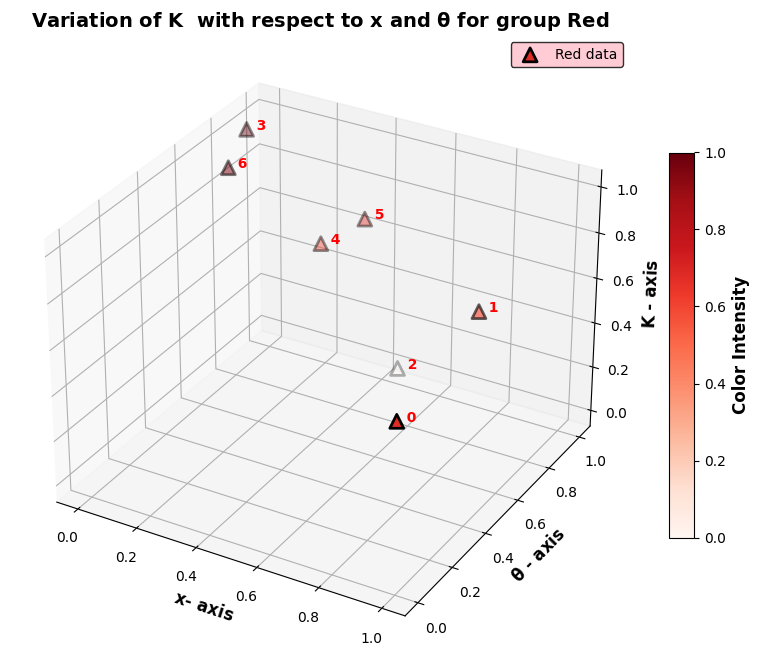

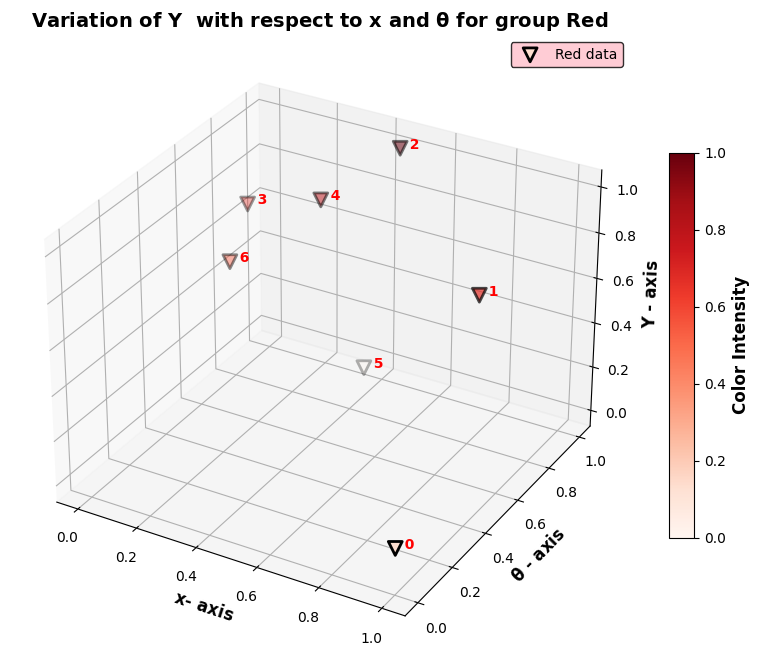

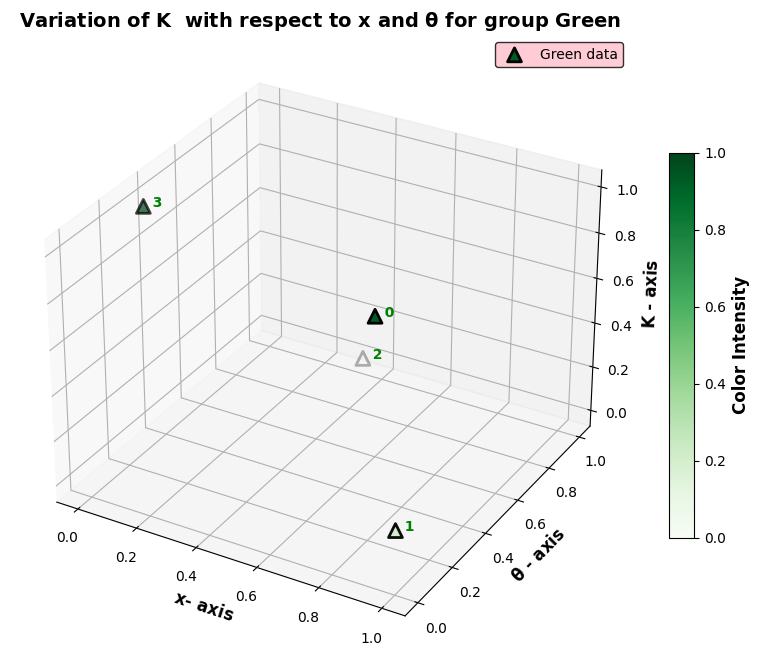

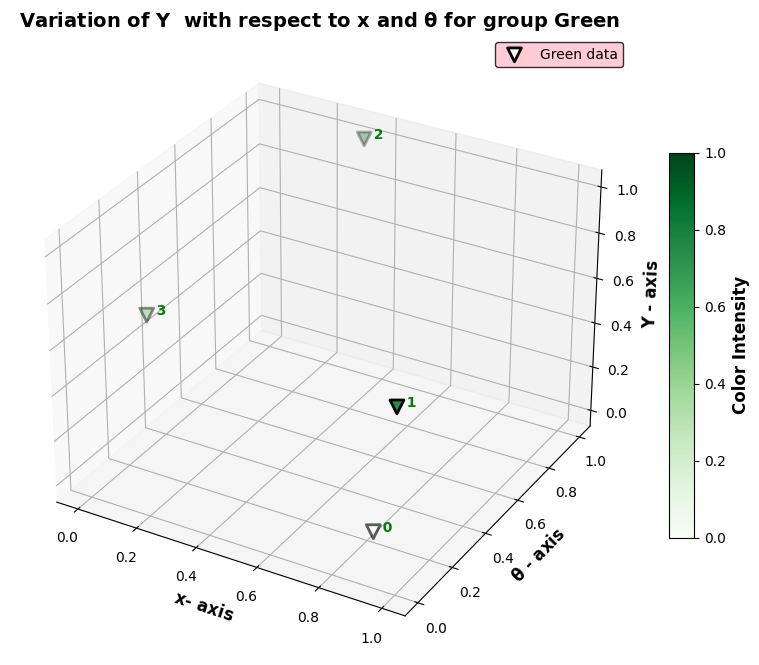

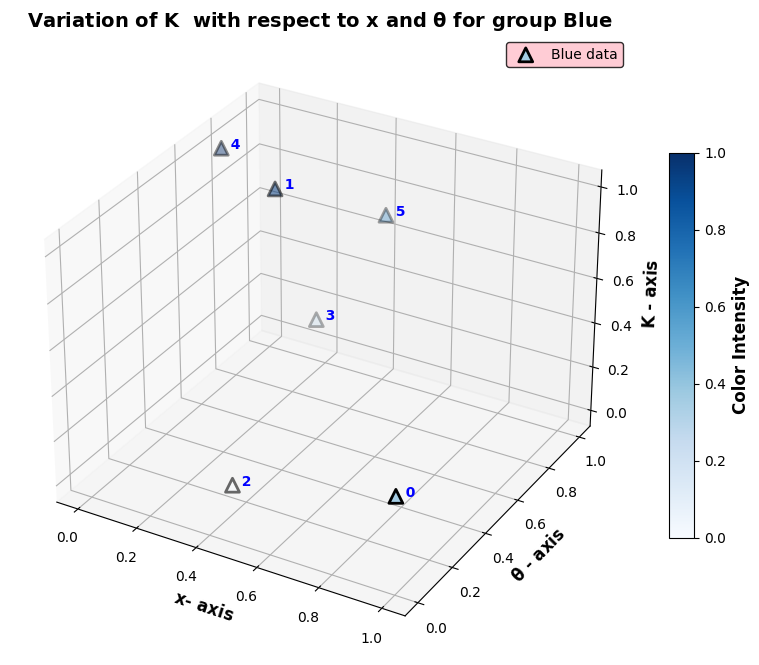

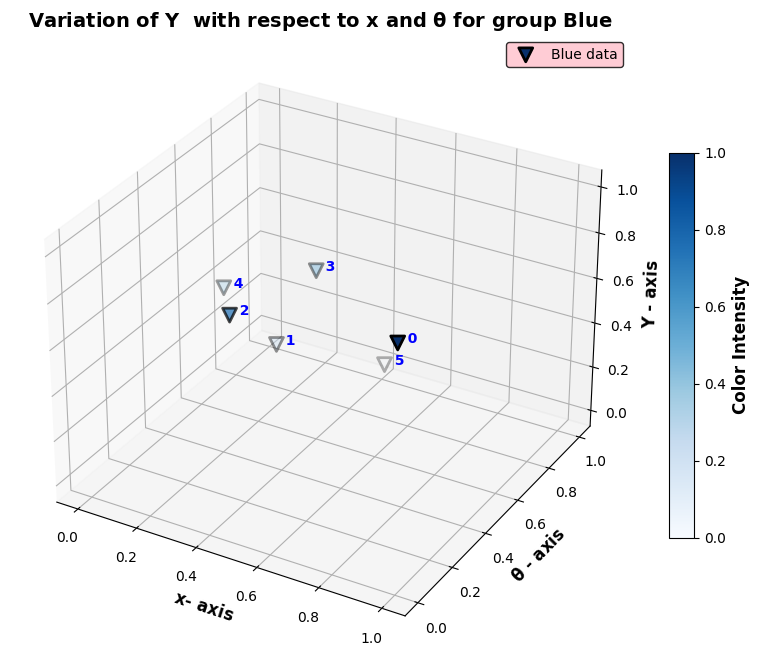

In [29]:
my_3d_plot(data_dict_s)

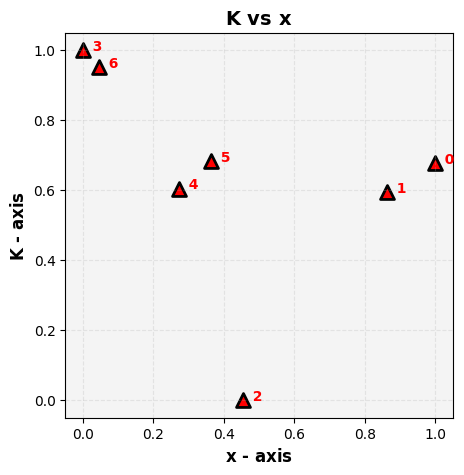

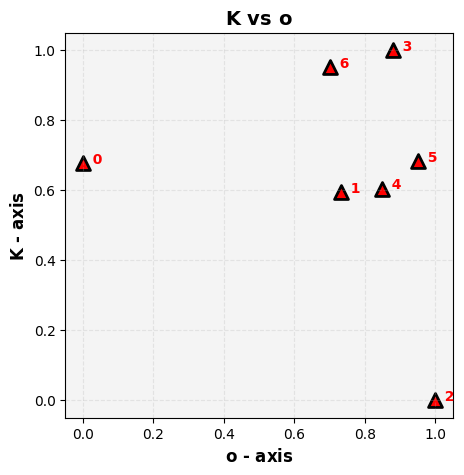

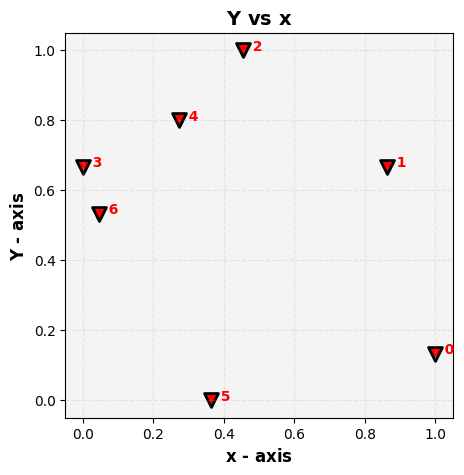

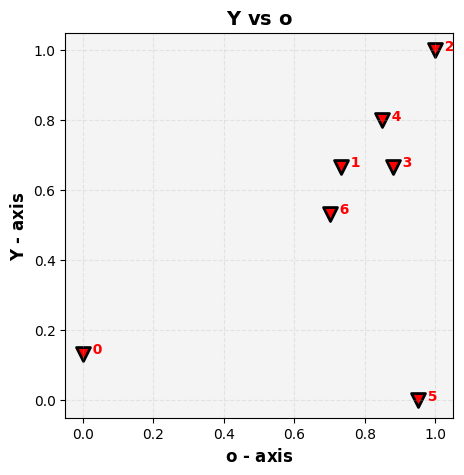

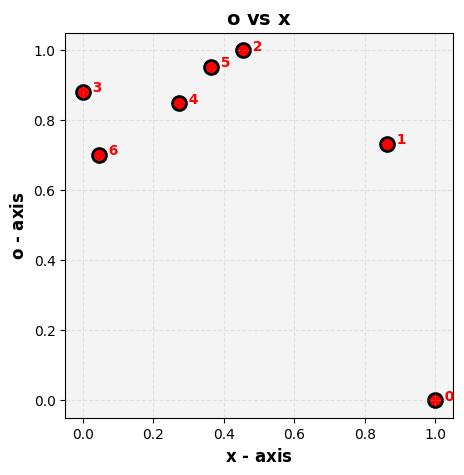

...

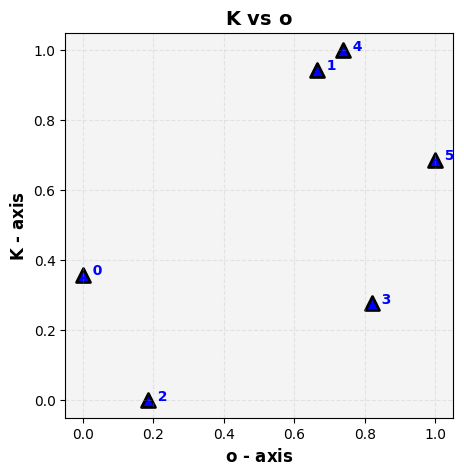

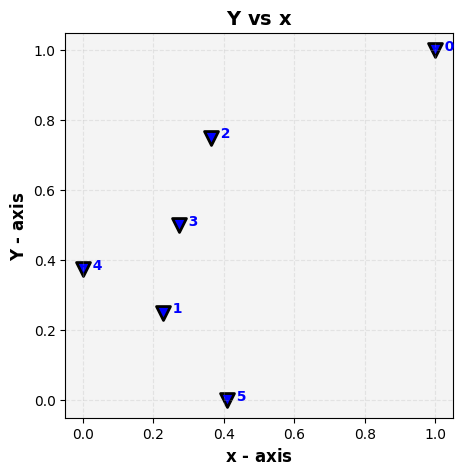

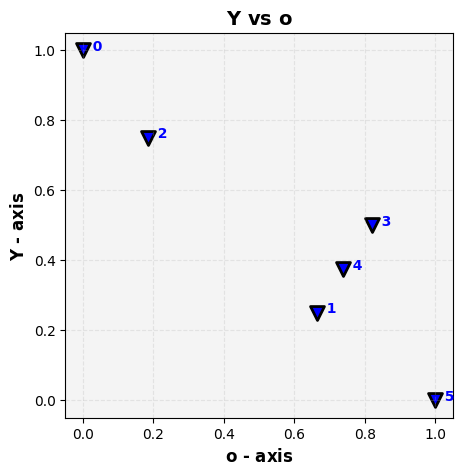

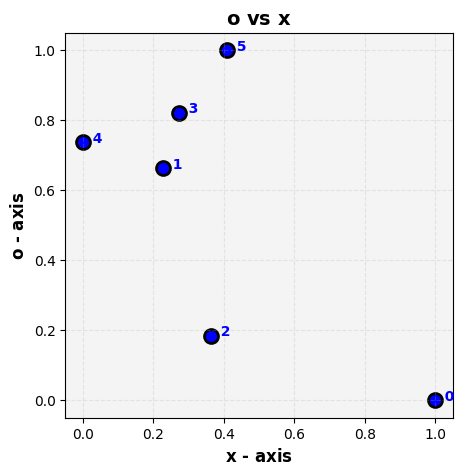

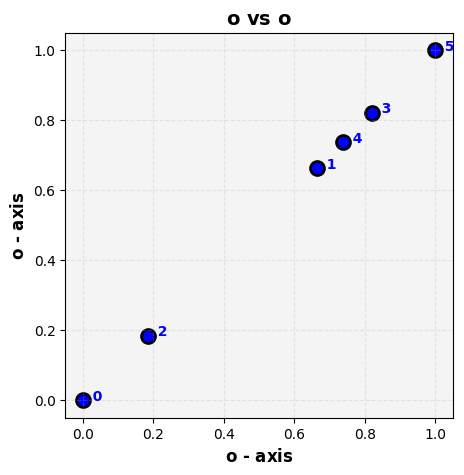

In [34]:
my_2d_plot(data_dict_s)

# Applying GPR to the data

Again we wish to write a cleaner code to solve for GPRs simultaneously.

In [11]:
x_scales_rgb = [max(np.sort(x_train_scaled_rgb[_])[1:]-np.sort(x_train_scaled_rgb[_])[:-1]) for _ in range(3)]
o_scales_rgb = [max(np.sort(o_train_scaled_rgb[_])[1:]-np.sort(o_train_scaled_rgb[_])[:-1]) for _ in range(3)]

In [12]:
length_scales  = [[1.98 * x_scales_rgb[_],1.98*o_scales_rgb[_]] for _ in range(3)]
noise_levels = [1e-9,1e-4,1e-4]

K_kernels = [1*RBF(length_scale = length_scales[_]) + WhiteKernel(
    noise_level=0.5e-3, noise_level_bounds=[1e-5,1e-2]) for _ in range(3)]

Y_kernels = [1*RBF(length_scale = length_scales[_]) + WhiteKernel(
    noise_level=1e-5, noise_level_bounds=[1e-6,1e-4]) for _ in range(3)] 

K_GP = [GPR(kernel=K_kernels[_],n_restarts_optimizer=10,random_state=1, optimizer=None) for _ in range(3)]
Y_GP = [GPR(kernel=Y_kernels[_],n_restarts_optimizer=10,random_state=1, optimizer=None) for _ in range(3)]

for _ in range(3):
    K_GP[_].fit(xo_train_scaled_rgb[_],K_train_scaled_rgb[_])
    Y_GP[_].fit(xo_train_scaled_rgb[_],Y_train_scaled_rgb[_])
#gp_Yxo.max_iter_predict = 100000000
data_dict_s["K_model"] = K_GP
data_dict_s["Y_model"] = Y_GP

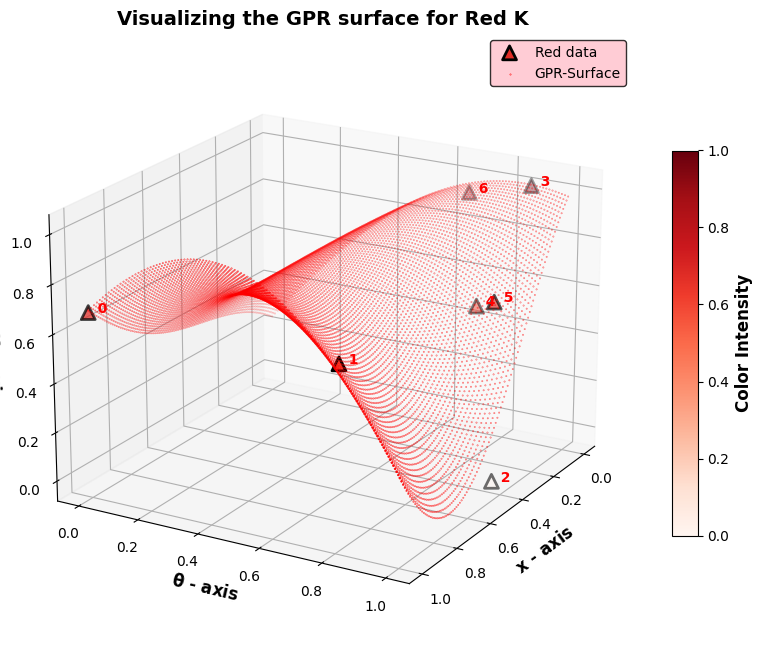

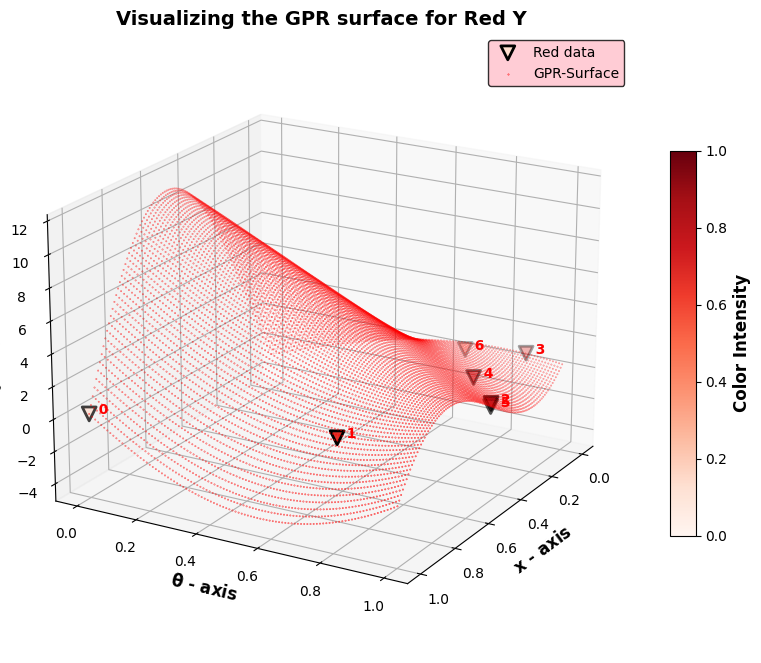

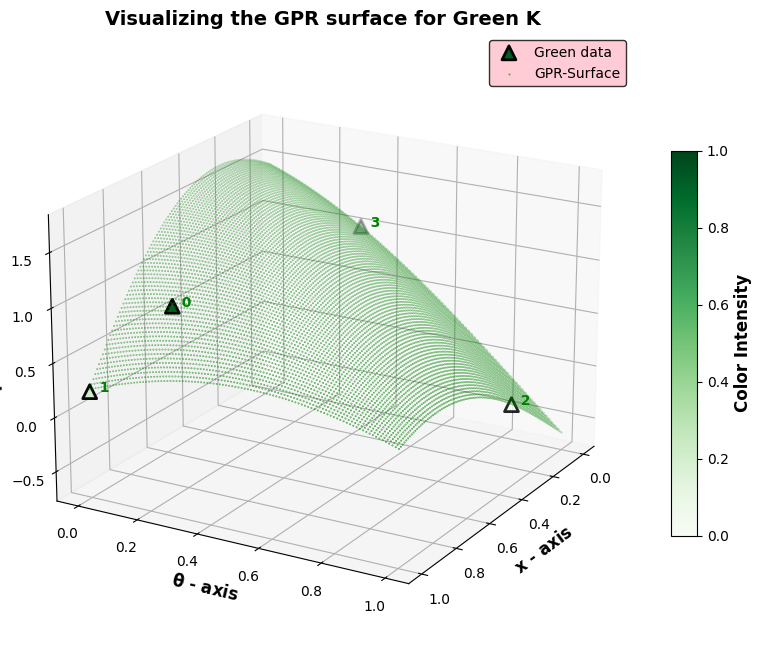

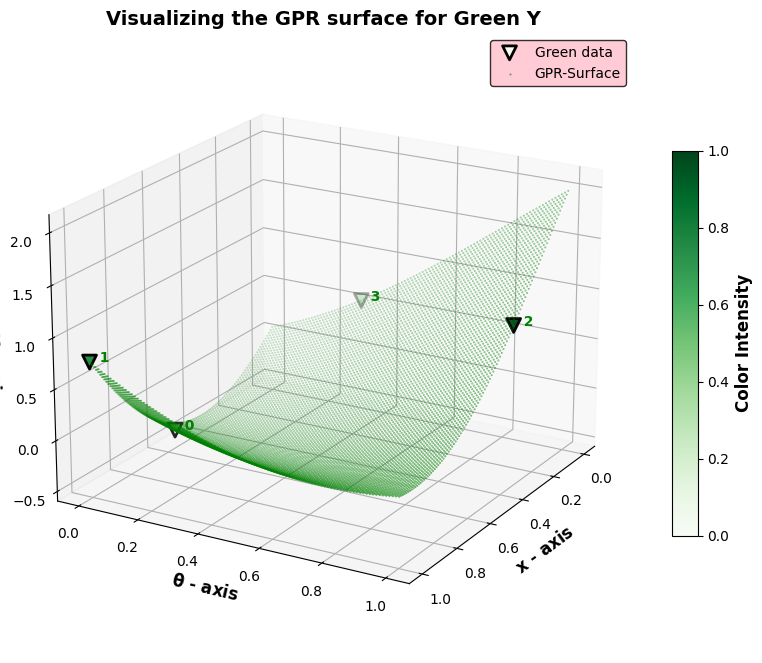

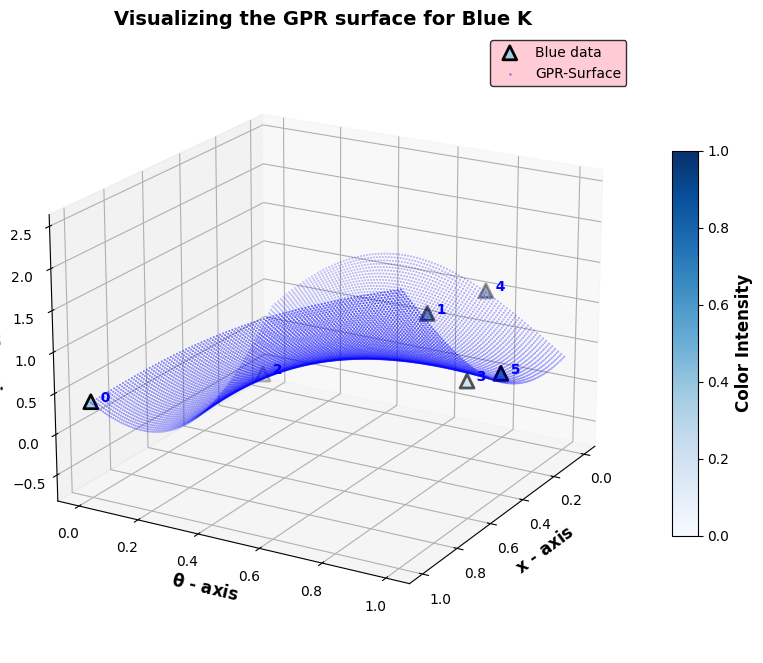

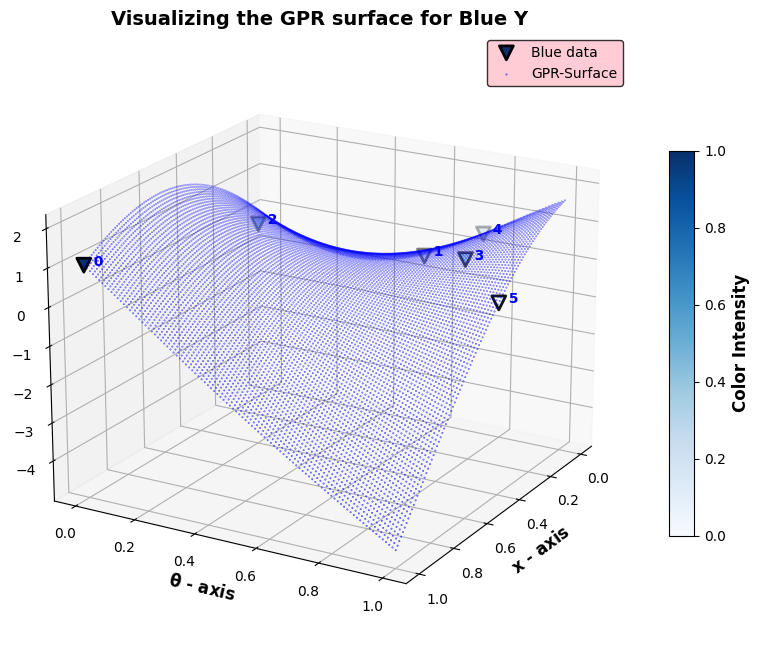

In [35]:
# Visualising the GPR surface
x_points = np.linspace(0,1,100)
o_points = np.linspace(0,1,100)
x_mesh,o_mesh = np.meshgrid(x_points,o_points)
xo_grid =np.hstack([x_mesh.reshape(-1,1), o_mesh.reshape(-1,1)])
# Mean surf has K_GPR surface, then Y_GPR surface of red, followed by green then blue
# Similarly with std_surf
K_mean_surf,K_std_surf, Y_mean_surf, Y_std_surf =[[] for _ in range(4)]

for _ in range(3):
    for index,__ in enumerate(["K_model","Y_model"]):
        
        mean,std = data_dict_s[__][_].predict(xo_grid,return_std=True)
        
        if index ==0: 
            K_mean_surf.append(mean)
            K_std_surf.append(std)
        if index ==1: 
            Y_mean_surf.append(mean)
            Y_std_surf.append(std)
            
        var_name = data_dict_s["names"][index]

        fig = plt.figure(figsize=[10,10])
        axs = fig.add_subplot(111,projection="3d")
        axs.set_xlabel("$\mathbf{x}$ - axis", fontweight="bold",fontsize=12)
        axs.set_ylabel("$\mathbf{\\theta}$ - axis", fontweight = "bold", fontsize=12)
        axs.set_zlabel(f"{data_dict_s['names'][index]} - axis", fontweight="bold", fontsize=12)
        axs.set_title(f"Visualizing the GPR surface for {data_dict_s['colors'][_]} {data_dict_s['names'][index]}",
                      fontweight="bold",
                      fontsize=14)
        scatter = axs.scatter(data_dict_s["x"][_],
                              data_dict_s["o"][_],
                              data_dict_s[var_name][_],c=data_dict_s[var_name][_],  
                              marker = data_dict_s["shapes"][index], 
                              edgecolor="k",linewidth=2,s=100, 
                              cmap= f"{data_dict_s['colors'][_]}s",
                              label= f"{data_dict_s['colors'][_]} data")
        for i, (x, o, Y) in enumerate(zip(data_dict_s["x"][_], data_dict_s["o"][_], data_dict_s[var_name][_])):
            axs.text(x, o, Y, f'  {i}', color=f"{data_dict_s['colors'][_]}", fontsize=10, fontweight='bold')
       
        axs.scatter(xo_grid[:,0], xo_grid[:,1], 
            mean, c=f"{data_dict_s['colors'][_]}", s = 0.1, label= "GPR-Surface")
        legend = axs.legend(loc="best",facecolor="pink", edgecolor="black")
        cbar = fig.colorbar(scatter, ax=axs, shrink=0.5, aspect=15)
        cbar.set_label('Color Intensity', fontsize=12, fontweight='bold')


        axs.view_init(elev=20, azim=30)
#         # Saving
#         file_name = f"3_GPR_scaled_{data_dict_s['names'][index]}_{data_dict_s['colors'][_]}.pdf"
#         file_loc = os.path.join(output_path,file_name)
#         plt.savefig(file_loc)


# A Better method
Having done a polynomial regression, we would like to proceed further but in a different way. This method currently I have no proof. But still lets proceed any way. Having the GPR function we would like to do GAM to the function. I have a method in mind. 

## Finding the mean function.

In [15]:
x_reg = xo_grid[:,0].reshape(-1,1)
o_reg = xo_grid[:,1].reshape(-1,1)
K_mean_reg_list = [K_mean_surf[_].reshape(-1,1) for _ in range(3)]
Y_mean_reg_list = [Y_mean_surf[_].reshape(-1,1) for _ in range(3)]
ones_reg = np.ones([np.size(x_reg),1])

In [16]:
# The points on the GPR are give by the co-ordinates xb_reg,ob_reg,Yxob_reg
## Finding mean 
### Mean by projecting GPR surface onto the Y-xb plane
def give_mean_x(K_mean_reg):
    mean_x_axis = np.zeros([np.size(x_points)])
    count=0
    for point in x_points:
        index = np.where(x_reg==point)
        mean_x_axis[count] = np.mean(K_mean_reg[index])
        count=count+1
    return mean_x_axis

### Mean by projecting GPR surface onto the Y-ob plane
def give_mean_o(Y_mean_reg):
    mean_o_axis = np.zeros([np.size(o_points)])
    count=0
    for point in o_points:
        index = np.where(o_reg==point)
        mean_o_axis[count] = np.mean(Y_mean_reg[index])
        count=count+1
    return mean_o_axis

K_mean_x_axis_list = [give_mean_x(K_mean_reg_list[_]) for _ in range(3)]
K_mean_o_axis_list = [give_mean_o(K_mean_reg_list[_]) for _ in range(3)]
Y_mean_x_axis_list = [give_mean_x(Y_mean_reg_list[_]) for _ in range(3)]
Y_mean_o_axis_list = [give_mean_o(Y_mean_reg_list[_]) for _ in range(3)]

In [38]:
# Plotting 
## Usual Fig start
def my_mean_plot_K(K_mean_x_axis_list,K_mean_o_axis_list):
    index = 0
    for _ in zip(K_mean_x_axis_list,K_mean_o_axis_list):
        var_name="k"
        print(index)
        fig, axs = plt.subplots(1,2,figsize=[12,6])
        axs[0].set_xlabel("X- Axis", fontweight="bold", fontsize=12)
        axs[1].set_xlabel("$\mathbf{\\theta}$-  Axis", fontweight= "bold", fontsize=12)
        fig.suptitle("Projecting GPR surface onto planes",fontweight="bold",fontsize=16)
        axs[0].set_title(f"GPR Projected onto {var_name}-x plane",fontweight="bold",fontsize=14)
        axs[1].set_title(f"GPR Projected onto {var_name}-o plane",fontweight="bold",fontsize=14)
        ## Actual Plots
        ### Projecting the GPR surface onto the xb-Axis
        axs[0].scatter(x_reg,K_mean_reg_list[index],c=f"{data_dict_s['colors'][index]}",s=0.1,label=f"GPR surface onto {var_name}-x plane")
        ### Projecting the GPR surface onto the ob-Axis
        axs[1].scatter(o_reg,K_mean_reg_list[index],c=f"{data_dict_s['colors'][index]}",s=0.1,label=f"GPR surface onto {var_name}-o plane")
        ### Plotting the mean onto Y-xb plane
        axs[0].scatter(x_points,_[0],c="k",s=1,label="Mean points")
        ### Plotting the mean onto Y-xb plane
        axs[1].scatter(o_points,_[1],c="k",s=1,label="Mean points")
        ## Usual figure repetitive stuff
        for i in [0,1]:
            axs[i].set_ylabel("K-Axis", fontweight="bold", fontsize=12)
            axs[i].set_facecolor("#f4f4f4")
            axs[i].grid(True, linestyle="--")
            legend = axs[i].legend(loc="best",facecolor="pink",edgecolor="k")
            legend.get_frame().set_linewidth(2)
            axs[i].tick_params(direction="inout", size=12)
            for spine_value in axs[i].spines.keys():
                axs[i].spines[spine_value].set_linewidth(2)
        
        
#         # Saving
#         file_name = f"4_mean_plots_K_{data_dict_s['colors'][index]}.pdf"
#         file_loc = os.path.join(output_path,file_name)
#         plt.savefig(file_loc)
        
        index = index+1

0
1
2


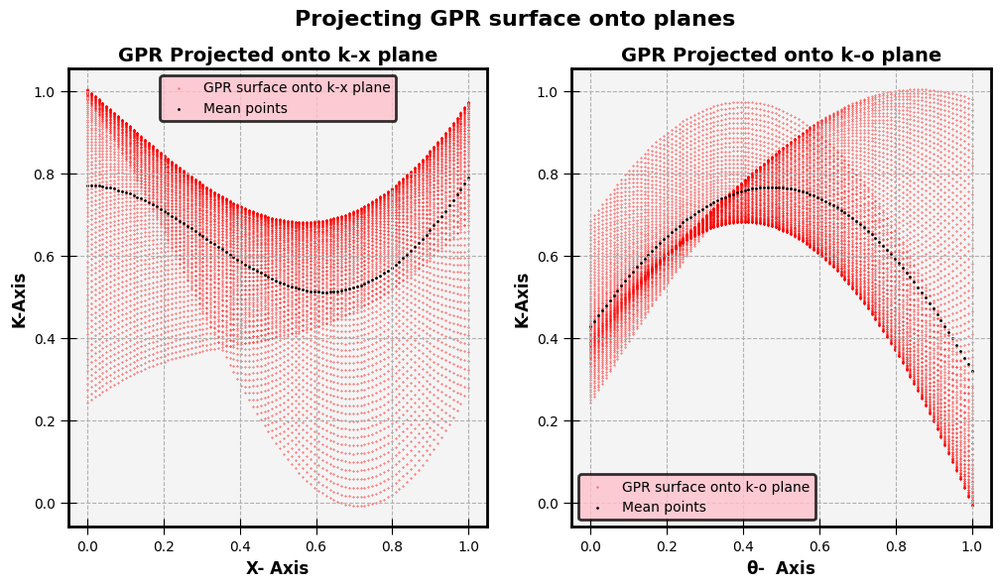

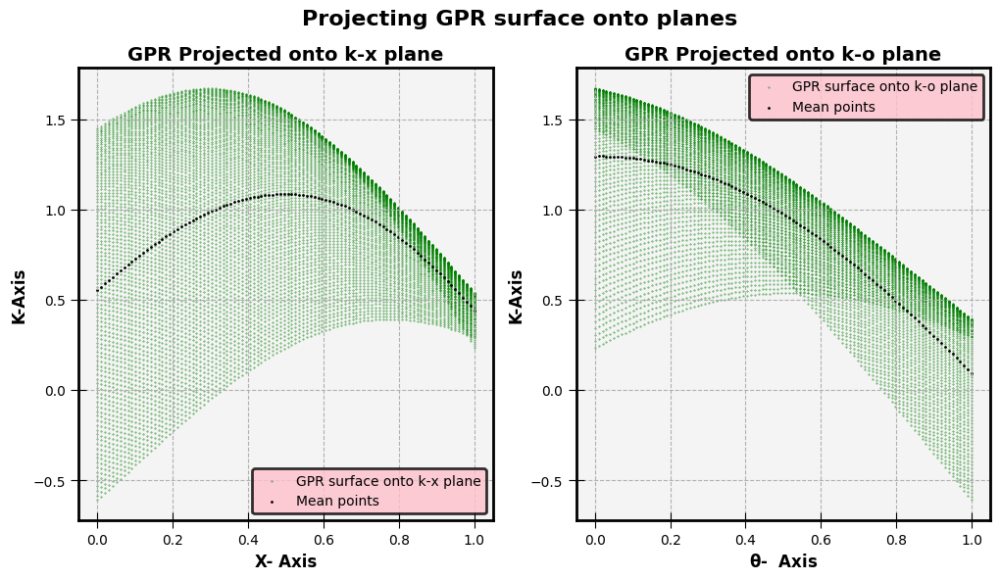

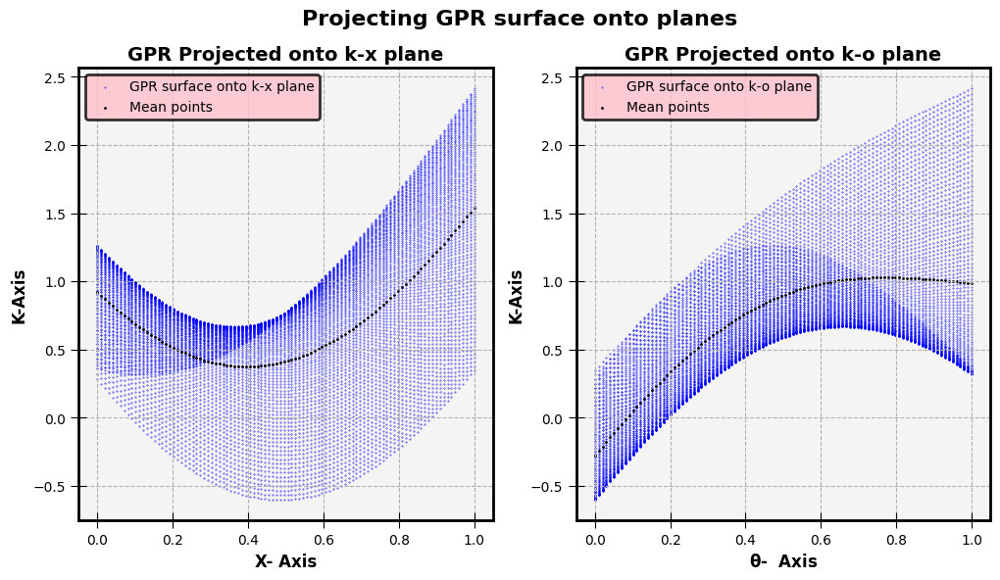

In [39]:
my_mean_plot_K(K_mean_x_axis_list,K_mean_o_axis_list)

In [42]:
# Plotting 
## Usual Fig start
def my_mean_plot_Y(Y_mean_x_axis_list,Y_mean_o_axis_list):
    index = 0
    for _ in zip(Y_mean_x_axis_list,Y_mean_o_axis_list):
        var_name="Y"
        print(index)
        fig, axs = plt.subplots(1,2,figsize=[12,6])
        axs[0].set_xlabel("X- Axis", fontweight="bold", fontsize=12)
        axs[1].set_xlabel("$\mathbf{\\theta}$-  Axis", fontweight= "bold", fontsize="12")
        fig.suptitle("Projecting GPR surface onto planes",fontweight="bold",fontsize=16)
        axs[0].set_title(f"GPR Projected onto {var_name}-x plane",fontweight="bold",fontsize=14)
        axs[1].set_title(f"GPR Projected onto {var_name}-o plane",fontweight="bold",fontsize=14)
        ## Actual Plots
        ### Projecting the GPR surface onto the xb-Axis
        axs[0].scatter(x_reg,Y_mean_reg_list[index],c=f"{data_dict_s['colors'][index]}",s=0.1,label=f"GPR surface onto {var_name}-x plane")
        ### Projecting the GPR surface onto the ob-Axis
        axs[1].scatter(o_reg,Y_mean_reg_list[index],c=f"{data_dict_s['colors'][index]}",s=0.1,label=f"GPR surface onto {var_name}-o plane")
        ### Plotting the mean onto Y-xb plane
        axs[0].scatter(x_points,_[0],c="k",s=1,label="Mean points")
        ### Plotting the mean onto Y-xb plane
        axs[1].scatter(o_points,_[1],c="k",s=1,label="Mean points")
        ## Usual figure repetitive stuff
        for i in [0,1]:
            axs[i].set_ylabel("Y-Axis", fontweight="bold", fontsize=12)
            axs[i].set_facecolor("#f4f4f4")
            axs[i].grid(True, linestyle="--")
            legend = axs[i].legend(loc="best",facecolor="pink",edgecolor="k")
            legend.get_frame().set_linewidth(2)
            axs[i].tick_params(direction="inout", size=12)
            for spine_value in axs[i].spines.keys():
                axs[i].spines[spine_value].set_linewidth(2)
            
        
#         # Saving
#         file_name = f"5_mean_plots_Y_{data_dict_s['colors'][index]}.pdf"
#         file_loc = os.path.join(output_path,file_name)
#         plt.savefig(file_loc)
        
        index = index+1

0
1
2


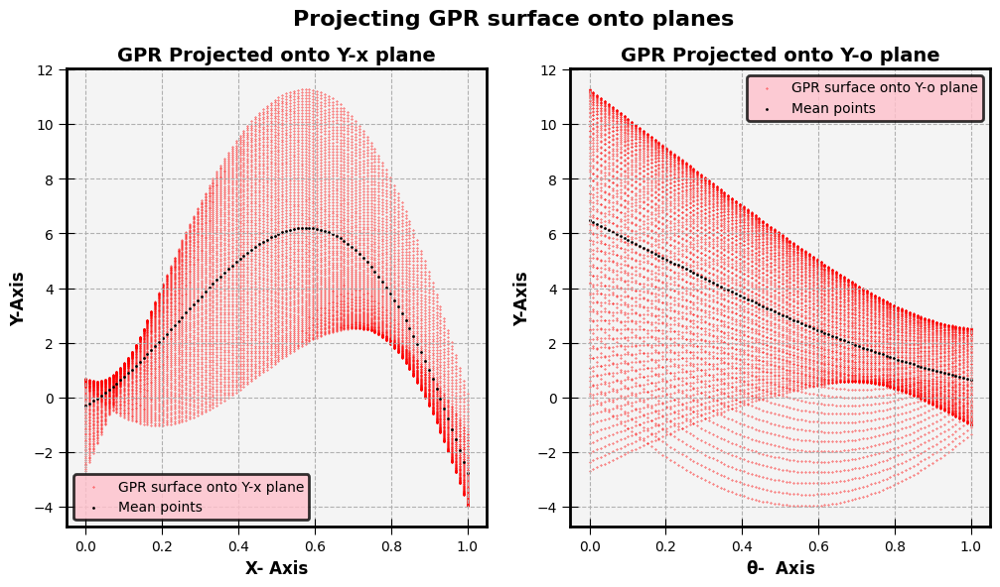

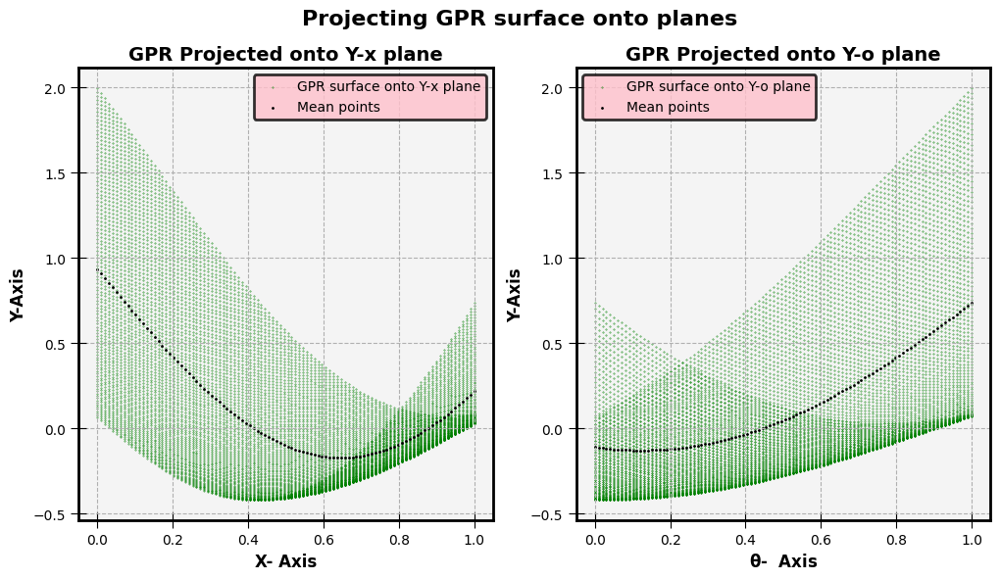

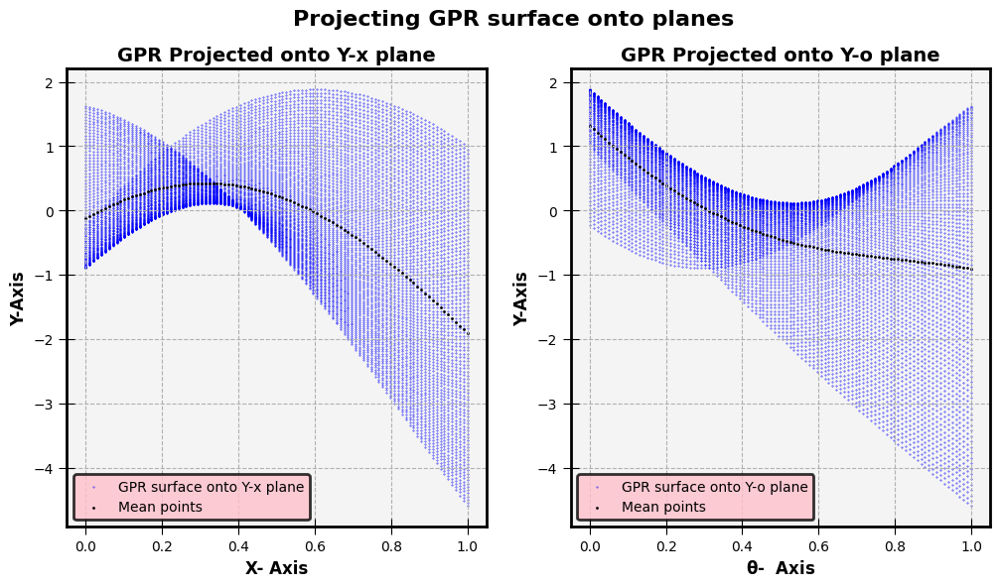

In [43]:
my_mean_plot_Y(Y_mean_x_axis_list,Y_mean_o_axis_list)

# Interpolating the mean function using Linear interpolation.
We have nx = np.size(xb_points)=100. But we know for better interpolation the lengthscale for performing GPR should be such that 0.85<(n-1)l<1.32 approximately can be written as 0.85<nl<1.32 for larger values of n. Therefore the length scale we are gonna choose is between [0.0085, 0.0132].

Instead of the above, we can simply use linear interpolation.

Now we have a list of mean points in Y_mean_x_axis_list,Y_mean_o_axis_list, K_mean_x_axis_list, K_mean_o_axis_list. Each list is a set of 3 arrays of points

In [21]:
from scipy.interpolate import interp1d

Y_meanfunc_x_list = [interp1d(x_points,Y_mean_x_axis_list[_]) for _ in range(3)]
Y_meanfunc_o_list = [interp1d(x_points,Y_mean_o_axis_list[_]) for _ in range(3)]
K_meanfunc_x_list = [interp1d(x_points,K_mean_x_axis_list[_]) for _ in range(3)]
K_meanfunc_o_list = [interp1d(x_points,K_mean_o_axis_list[_]) for _ in range(3)]

# Doing regression on the obtained GPR functions

We now have interpolated functions, we intend to do regression for these functions to obtain the functional dependence.

a.func_x + b. func_y + c

In [22]:
# Finding co efficients for Y functions
Y_meanfunc_x_val_list = [Y_meanfunc_x_list[_](x_reg) for _ in range(3)]
Y_meanfunc_o_val_list = [Y_meanfunc_o_list[_](o_reg) for _ in range(3)]
coeff_Y_list = []
Y_GAM_list = []
for _ in range(3):
    Matrix = np.hstack([Y_meanfunc_x_val_list[_],Y_meanfunc_o_val_list[_],ones_reg])
    Matrix_pinv = np.linalg.pinv(Matrix)
    co_effs = np.matmul(Matrix_pinv,Y_mean_reg_list[_])
    coeff_Y_list.append(co_effs)
    # Evaluating the GAM at the grid points
    Y_GAM_list.append(np.matmul(Matrix,co_effs))

In [23]:
# Finding co efficients for K functions
K_meanfunc_x_val_list = [K_meanfunc_x_list[_](x_reg) for _ in range(3)]
K_meanfunc_o_val_list = [K_meanfunc_o_list[_](o_reg) for _ in range(3)]
coeff_K_list = []
K_GAM_list = []
for _ in range(3):
    Matrix = np.hstack([K_meanfunc_x_val_list[_],K_meanfunc_o_val_list[_],ones_reg])
    Matrix_pinv = np.linalg.pinv(Matrix)
    co_effs = np.matmul(Matrix_pinv,K_mean_reg_list[_])
    coeff_K_list.append(co_effs)
    # Evaluating the GAM at the grid points
    K_GAM_list.append(np.matmul(Matrix,co_effs))

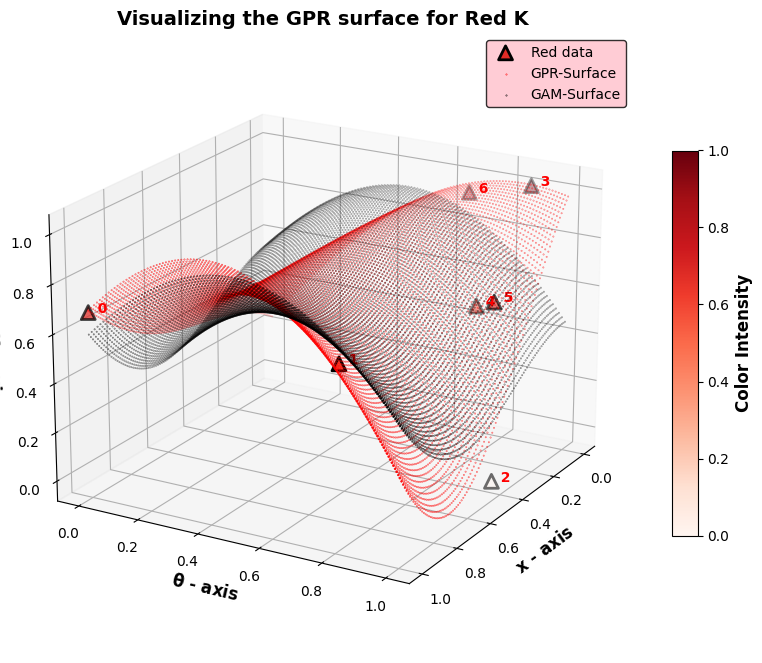

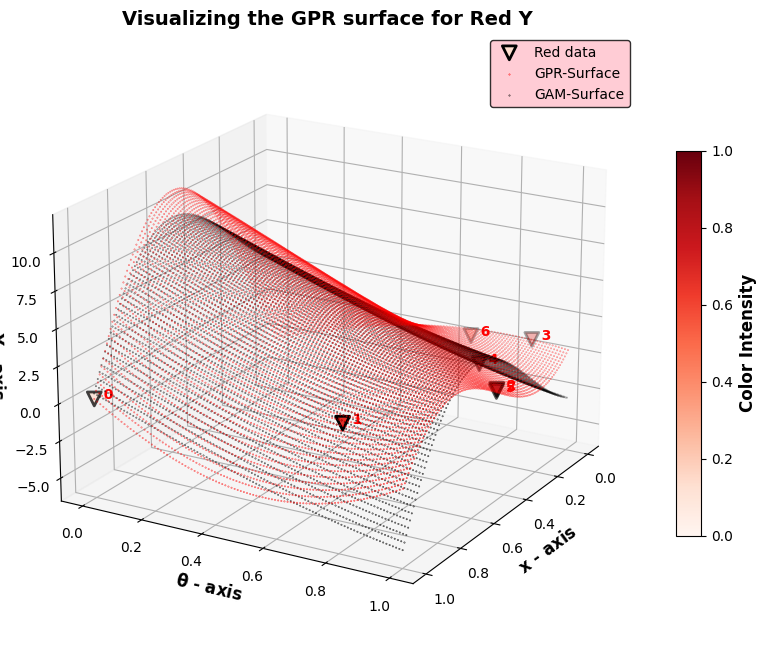

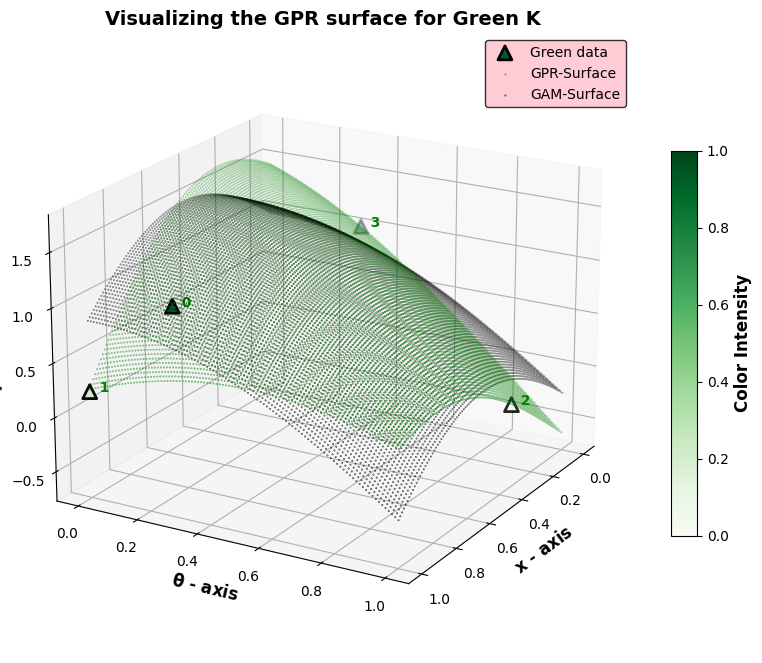

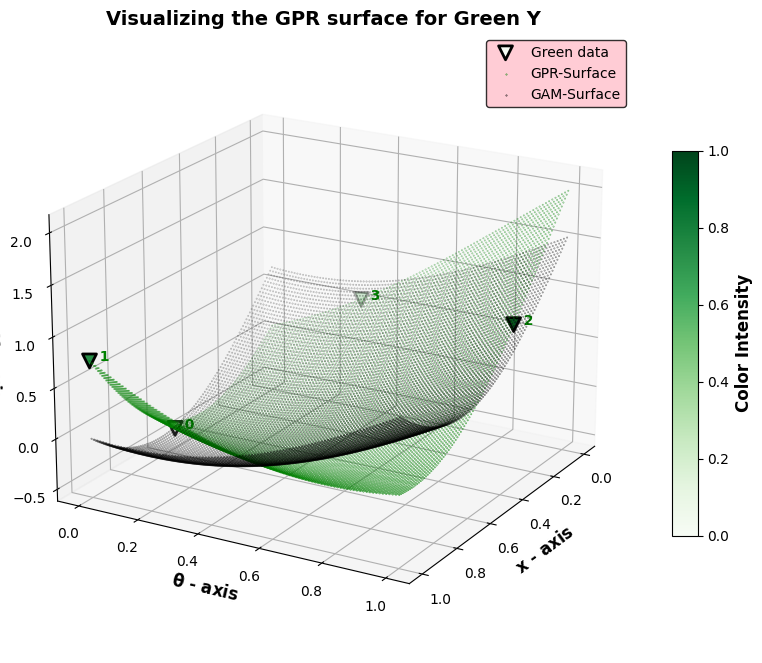

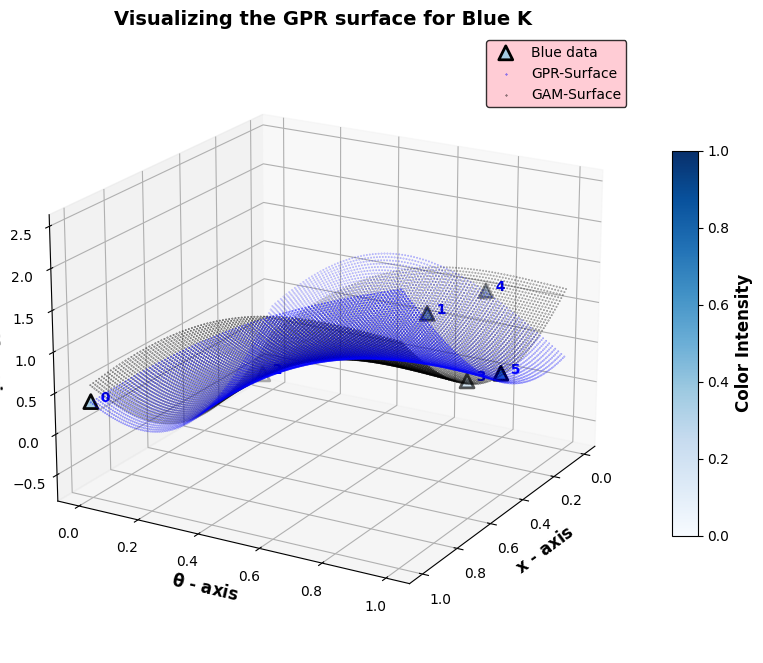

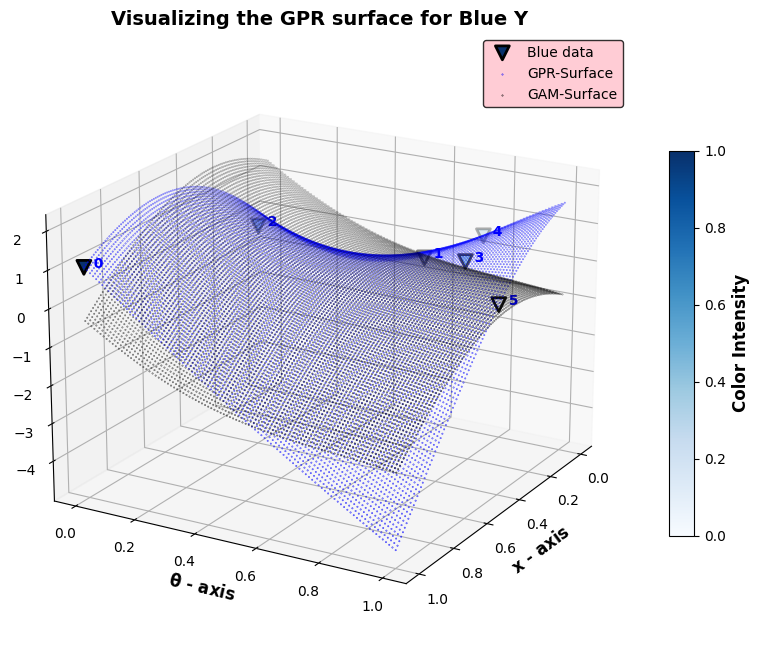

In [44]:
for _ in range(3):
    for index,__ in enumerate(["K_model","Y_model"]):
        
        mean,std = data_dict_s[__][_].predict(xo_grid,return_std=True)
        
        if index ==0: 
            GAM_surf = K_GAM_list[_]
        if index ==1: 
            GAM_surf = Y_GAM_list[_]
            
        var_name = data_dict_s["names"][index]

        fig = plt.figure(figsize=[10,10])
        axs = fig.add_subplot(111,projection="3d")
        axs.set_xlabel("$\mathbf{x}$ - axis", fontweight="bold",fontsize=12)
        axs.set_ylabel("$\mathbf{\\theta}$ - axis", fontweight = "bold", fontsize=12)
        axs.set_zlabel(f"{data_dict_s['names'][index]} - axis", fontweight="bold", fontsize=12)
        axs.set_title(f"Visualizing the GPR surface for {data_dict_s['colors'][_]} {data_dict_s['names'][index]}",
                      fontweight="bold",
                      fontsize=14)
        scatter = axs.scatter(data_dict_s["x"][_],
                              data_dict_s["o"][_],
                              data_dict_s[var_name][_],
                              c=data_dict_s[var_name][_],  
                              marker = data_dict_s["shapes"][index], 
                              edgecolor="k",linewidth=2,s=100, 
                              cmap= f"{data_dict_s['colors'][_]}s",
                              label= f"{data_dict_s['colors'][_]} data")
        for i, (x, o, Y) in enumerate(zip(data_dict_s["x"][_], data_dict_s["o"][_], data_dict_s[var_name][_])):
            axs.text(x, o, Y, f'  {i}', color=f"{data_dict_s['colors'][_]}", fontsize=10, fontweight='bold')
       
        axs.scatter(xo_grid[:,0],
                    xo_grid[:,1],
                    mean,
                    c=f"{data_dict_s['colors'][_]}",
                    s = 0.1, label= "GPR-Surface")
        
        axs.scatter(x_reg,
                    o_reg,
                    GAM_surf,
                    c="k",
                    s = 0.1, label= "GAM-Surface")        
     
        legend = axs.legend(loc="best",facecolor="pink", edgecolor="black")
        cbar = fig.colorbar(scatter, ax=axs, shrink=0.5, aspect=15)
        cbar.set_label('Color Intensity', fontsize=12, fontweight='bold')

        axs.view_init(elev=20, azim=30)
        
        # Saving
        file_name = f"6_GAM_{data_dict_s['names'][index]}_{data_dict_s['colors'][_]}.pdf"
        file_loc = os.path.join(output_path,file_name)
        plt.savefig(file_loc)

        
        plt.show(fig) 


# GAM on subtracted surface.
But before that let us create the subtracted surfaces and visualise them

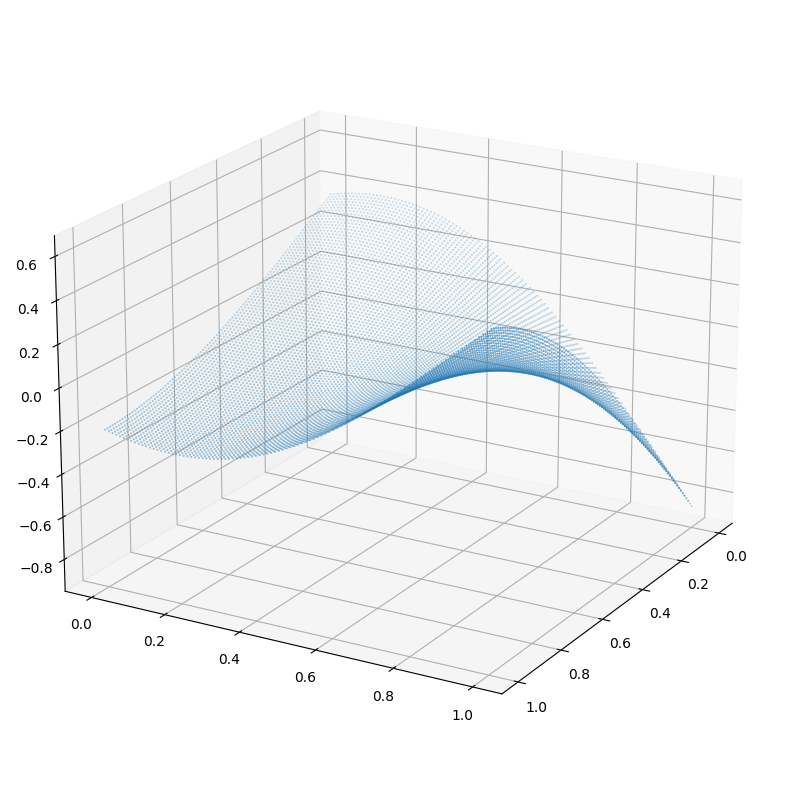

In [73]:
K_sub_list = [K_mean_surf[_] - K_GAM_list[_][:,0] for _ in range(3)]
Y_sub_list = [Y_mean_surf[_]- Y_GAM_list[_][:,0] for _ in range(3)]

#Visualizing the GAM surfaces
fig = plt.figure(figsize=[10,10])
axs = fig.add_subplot(111,projection="3d")
axs.scatter(x_reg,o_reg,K_sub_list[2],s=0.1)
axs.view_init(elev=20, azim=30)

In [74]:

K_sub_reg_list = [K_sub_list[_].reshape(-1,1) for _ in range(3)]
Y_sub_reg_list = [K_sub_list[_].reshape(-1,1) for _ in range(3)]


In [75]:
# The points on the GPR are give by the co-ordinates xb_reg,ob_reg,Yxob_reg
## Finding mean 
### Mean by projecting GPR surface onto the Y-xb plane
def give_mean_x(K_mean_reg):
    mean_x_axis = np.zeros([np.size(x_points)])
    count=0
    for point in x_points:
        index = np.where(x_reg==point)
        mean_x_axis[count] = np.mean(K_mean_reg[index])
        count=count+1
    return mean_x_axis

### Mean by projecting GPR surface onto the Y-ob plane
def give_mean_o(Y_mean_reg):
    mean_o_axis = np.zeros([np.size(o_points)])
    count=0
    for point in o_points:
        index = np.where(o_reg==point)
        mean_o_axis[count] = np.mean(Y_mean_reg[index])
        count=count+1
    return mean_o_axis

K_sub_mean_x_axis_list = [give_mean_x(K_sub_reg_list[_]) for _ in range(3)]
K_sub_mean_o_axis_list = [give_mean_o(K_sub_reg_list[_]) for _ in range(3)]
Y_sub_mean_x_axis_list = [give_mean_x(Y_sub_reg_list[_]) for _ in range(3)]
Y_sub_mean_o_axis_list = [give_mean_o(Y_sub_reg_list[_]) for _ in range(3)]

In [77]:
def my_mean_sub_plot_Y(Y_mean_x_axis_list,Y_mean_o_axis_list):
    index = 0
    for _ in zip(Y_mean_x_axis_list,Y_mean_o_axis_list):
        var_name="Y"
        print(index)
        fig, axs = plt.subplots(1,2,figsize=[12,6])
        axs[0].set_xlabel("X- Axis", fontweight="bold", fontsize=12)
        axs[1].set_xlabel("$\mathbf{\\theta}$-  Axis", fontweight= "bold", fontsize="12")
        fig.suptitle("Projecting GPR surface onto planes",fontweight="bold",fontsize=16)
        axs[0].set_title(f"GPR Projected onto {var_name}-x plane",fontweight="bold",fontsize=14)
        axs[1].set_title(f"GPR Projected onto {var_name}-o plane",fontweight="bold",fontsize=14)
        ## Actual Plots
        ### Projecting the GPR surface onto the xb-Axis
        axs[0].scatter(x_reg,Y_sub_reg_list[index],c=f"{data_dict_s['colors'][index]}",s=0.1,label=f"GPR surface onto {var_name}-x plane")
        ### Projecting the GPR surface onto the ob-Axis
        axs[1].scatter(o_reg,Y_sub_reg_list[index],c=f"{data_dict_s['colors'][index]}",s=0.1,label=f"GPR surface onto {var_name}-o plane")
        ### Plotting the mean onto Y-xb plane
        axs[0].scatter(x_points,_[0],c="k",s=1,label="Mean points")
        ### Plotting the mean onto Y-xb plane
        axs[1].scatter(o_points,_[1],c="k",s=1,label="Mean points")
        ## Usual figure repetitive stuff
        for i in [0,1]:
            axs[i].set_ylabel("Y-Axis", fontweight="bold", fontsize=12)
            axs[i].set_facecolor("#f4f4f4")
            axs[i].grid(True, linestyle="--")
            legend = axs[i].legend(loc="best",facecolor="pink",edgecolor="k")
            legend.get_frame().set_linewidth(2)
            axs[i].tick_params(direction="inout", size=12)
            for spine_value in axs[i].spines.keys():
                axs[i].spines[spine_value].set_linewidth(2)
            
        
#         # Saving
#         file_name = f"5_mean_plots_Y_{data_dict_s['colors'][index]}.pdf"
#         file_loc = os.path.join(output_path,file_name)
#         plt.savefig(file_loc)
        
        index = index+1

0
1
2


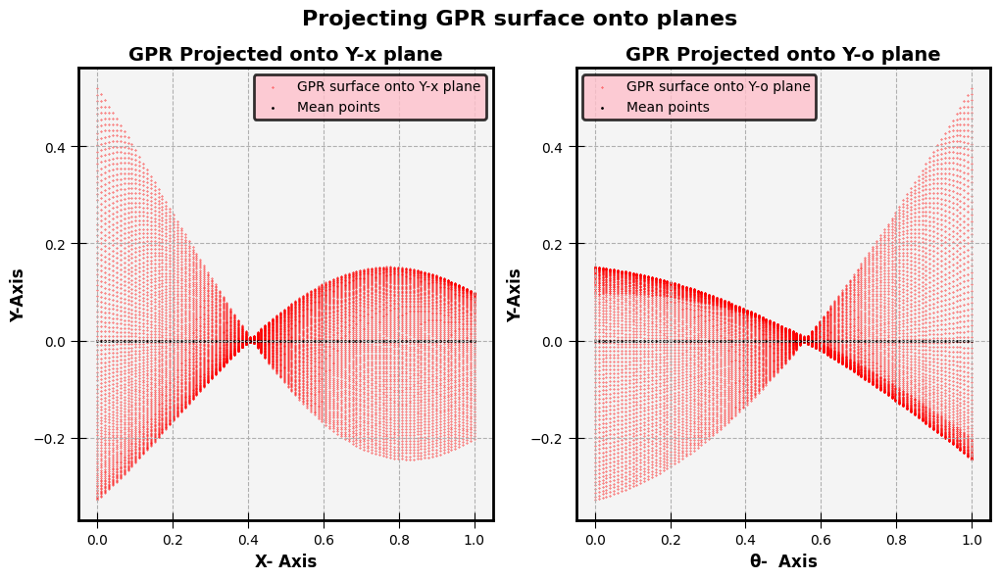

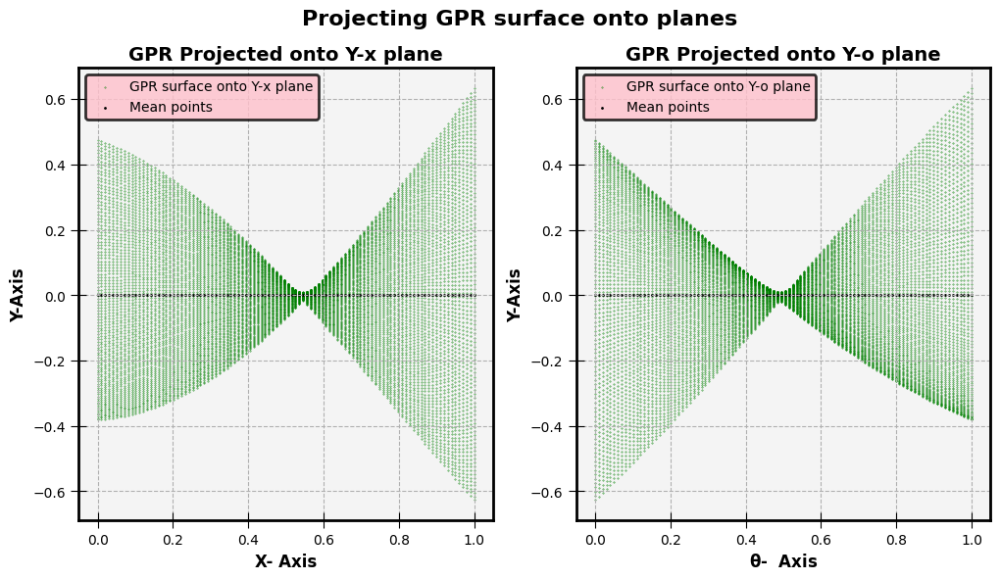

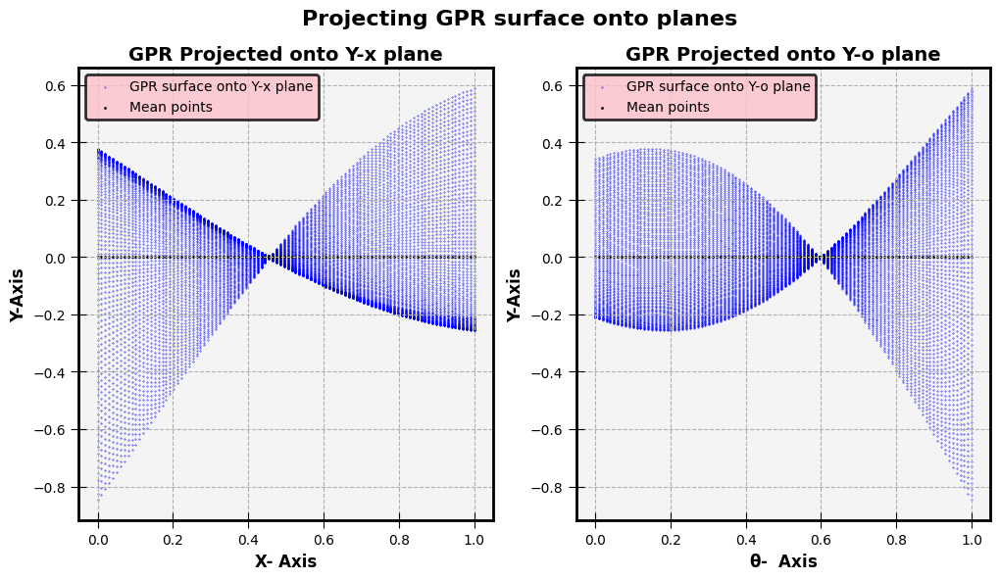

In [78]:
my_mean_sub_plot_Y(Y_sub_mean_x_axis_list,Y_sub_mean_o_axis_list)

In [79]:
def my_mean_sub_plot_K(K_mean_x_axis_list,K_mean_o_axis_list):
    index = 0
    for _ in zip(K_mean_x_axis_list,K_mean_o_axis_list):
        var_name="K"
        print(index)
        fig, axs = plt.subplots(1,2,figsize=[12,6])
        axs[0].set_xlabel("X- Axis", fontweight="bold", fontsize=12)
        axs[1].set_xlabel("$\mathbf{\\theta}$-  Axis", fontweight= "bold", fontsize="12")
        fig.suptitle("Projecting GPR surface onto planes",fontweight="bold",fontsize=16)
        axs[0].set_title(f"GPR Projected onto {var_name}-x plane",fontweight="bold",fontsize=14)
        axs[1].set_title(f"GPR Projected onto {var_name}-o plane",fontweight="bold",fontsize=14)
        ## Actual Plots
        ### Projecting the GPR surface onto the xb-Axis
        axs[0].scatter(x_reg,K_sub_reg_list[index],c=f"{data_dict_s['colors'][index]}",s=0.1,label=f"GPR surface onto {var_name}-x plane")
        ### Projecting the GPR surface onto the ob-Axis
        axs[1].scatter(o_reg,K_sub_reg_list[index],c=f"{data_dict_s['colors'][index]}",s=0.1,label=f"GPR surface onto {var_name}-o plane")
        ### Plotting the mean onto K-xb plane
        axs[0].scatter(x_points,_[0],c="k",s=1,label="Mean points")
        ### Plotting the mean onto K-xb plane
        axs[1].scatter(o_points,_[1],c="k",s=1,label="Mean points")
        ## Usual figure repetitive stuff
        for i in [0,1]:
            axs[i].set_ylabel("K-Axis", fontweight="bold", fontsize=12)
            axs[i].set_facecolor("#f4f4f4")
            axs[i].grid(True, linestyle="--")
            legend = axs[i].legend(loc="best",facecolor="pink",edgecolor="k")
            legend.get_frame().set_linewidth(2)
            axs[i].tick_params(direction="inout", size=12)
            for spine_value in axs[i].spines.keys():
                axs[i].spines[spine_value].set_linewidth(2)
            
        
#         # Saving
#         file_name = f"5_mean_plots_K_{data_dict_s['colors'][index]}.pdf"
#         file_loc = os.path.join(output_path,file_name)
#         plt.savefig(file_loc)
        
        index = index+1

0
1
2


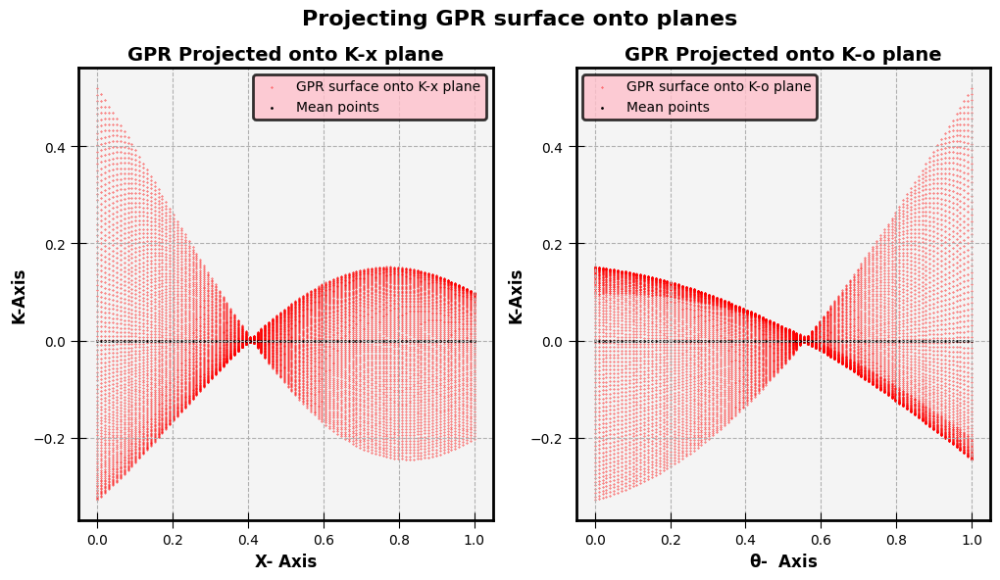

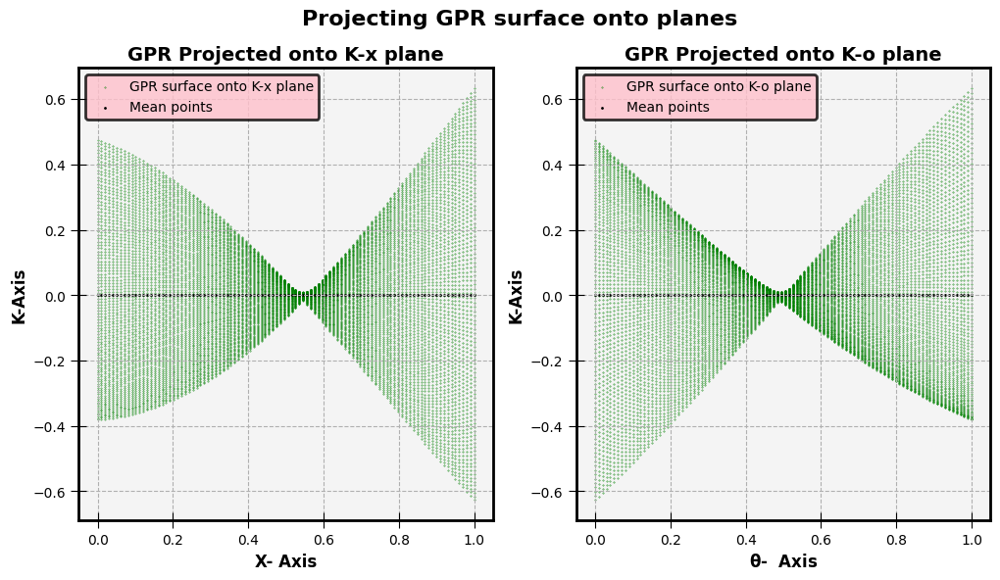

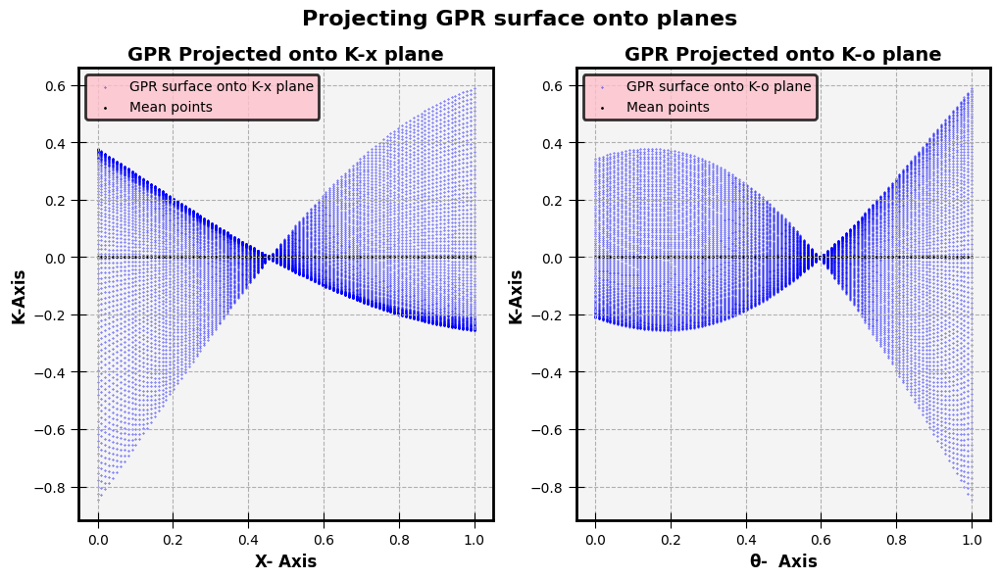

In [81]:
my_mean_sub_plot_K(K_sub_mean_x_axis_list,K_sub_mean_o_axis_list)

# Cutting the planes at fixed theta.

/var/folders/yh/jc0pysz13d356254dbrfhtth0000gn/T/ipykernel_50785/2300279395.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1,1,figsize=[5,5])


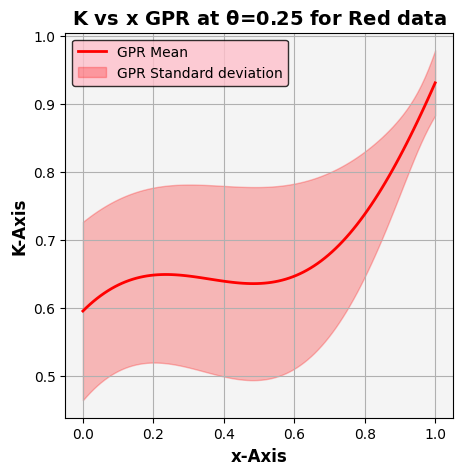

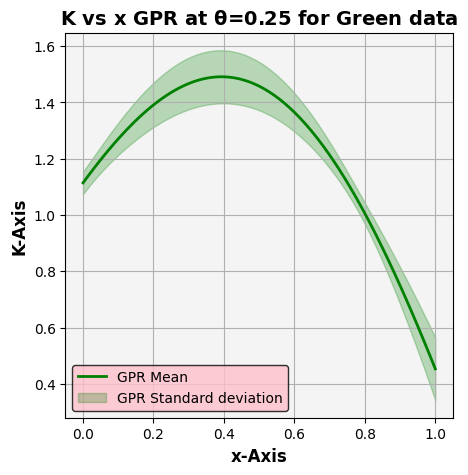

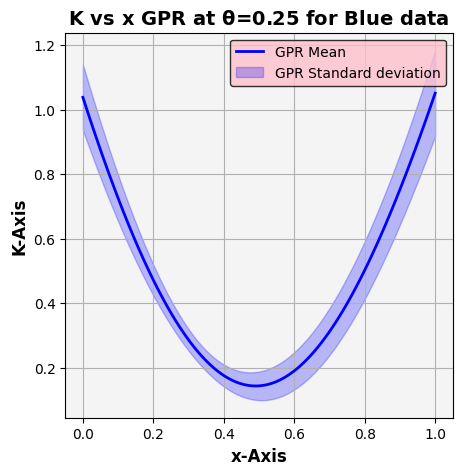

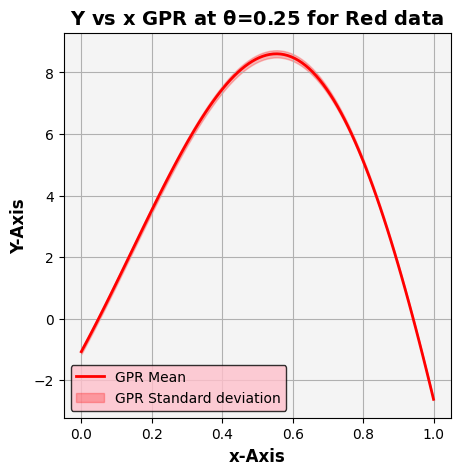

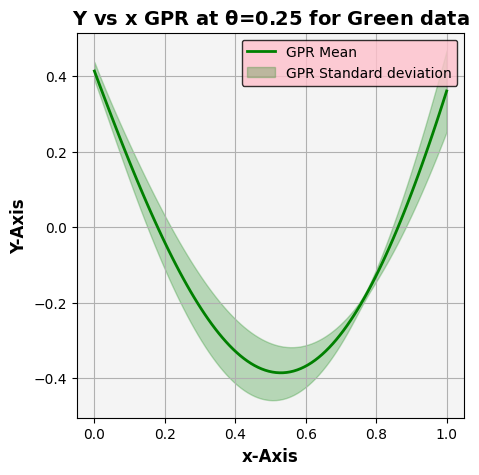

...

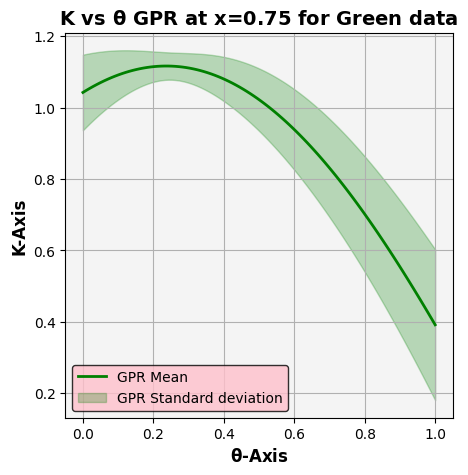

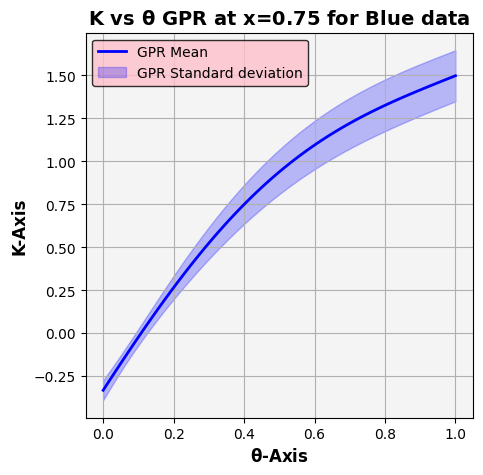

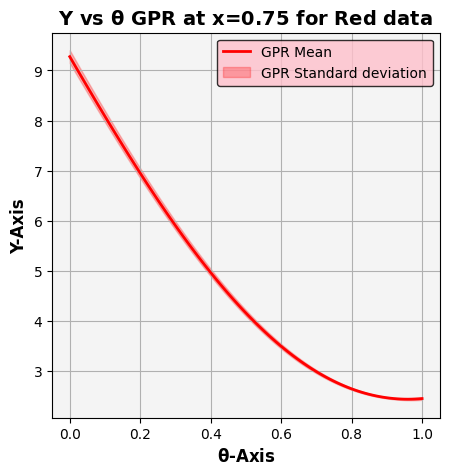

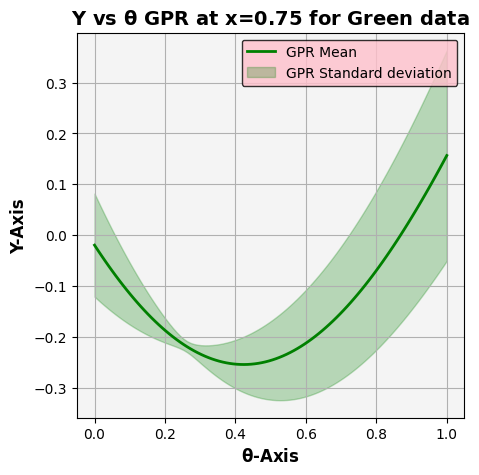

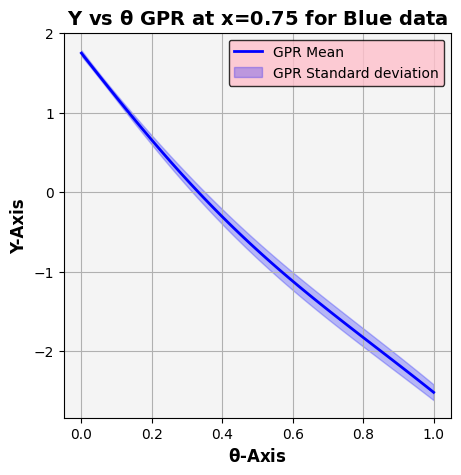

In [109]:
fixed_values = [0.25,0.5,0.75]
one_points = np.ones(100)
for fixed_value in fixed_values:
    fixed_value_array = one_points * fixed_value
    x_var_o_fixed = np.transpose(np.vstack([x_points,fixed_value_array]))
    o_var_x_fixed = np.transpose(np.vstack([fixed_value_array,o_points]))
    for index,xo_var_fixed in enumerate([x_var_o_fixed,o_var_x_fixed]):
        for model in ['K_model','Y_model']:
            for _ in range(3):
                mean,std = data_dict_s[model][_].predict(xo_var_fixed,return_std=True)
                fig, axs = plt.subplots(1,1,figsize=[5,5])
                
                if index == 0: 
                    x_label = "x"  
                    fixed_var = "$\\mathbf{\\theta}$"
                    x_label_save = "x"
                    fixed_var_save = 'o'
                if index == 1: 
                    x_label = "$\\mathbf{\\theta}$"
                    fixed_var = 'x'
                    x_label_save = "o"
                    fixed_var_save = 'x'
                if model == 'K_model': y_label = "K"
                if model == 'Y_model': y_label = "Y"
                    
                axs.set_xlabel(f"{x_label}-Axis",fontweight="bold",fontsize=12) 
                axs.set_ylabel(f"{y_label}-Axis",fontweight="bold",fontsize=12) 
                axs.set_title(f"{y_label} vs {x_label} GPR at {fixed_var}={fixed_value} for {data_dict_s['colors'][_]} data",
                              fontweight = "bold",
                              fontsize=14)
                
                axs.set_facecolor("#f4f4f4")
                axs.grid()
                axs.plot(x_points,mean, color = data_dict_s["colors"][_],linewidth=2, label = "GPR Mean")
                axs.fill_between(x_points,
                                 mean+std,
                                 mean-std,
                                 color= data_dict_s["colors"][_],
                                 alpha = 0.25,
                                 label = "GPR Standard deviation"
                                 )
                axs.legend(loc="best",facecolor="pink",edgecolor="black")
                
#                 #saveing the plots
#                 file_name = f"7_{data_dict_s['colors'][_]}_{y_label}_vs_{x_label_save}_GPR_at_{fixed_var_save}_{fixed_value}_.pdf"
#                 file_loc = os.path.join(output_path,file_name)
#                 plt.savefig(file_loc)
                

# Poly_GAM

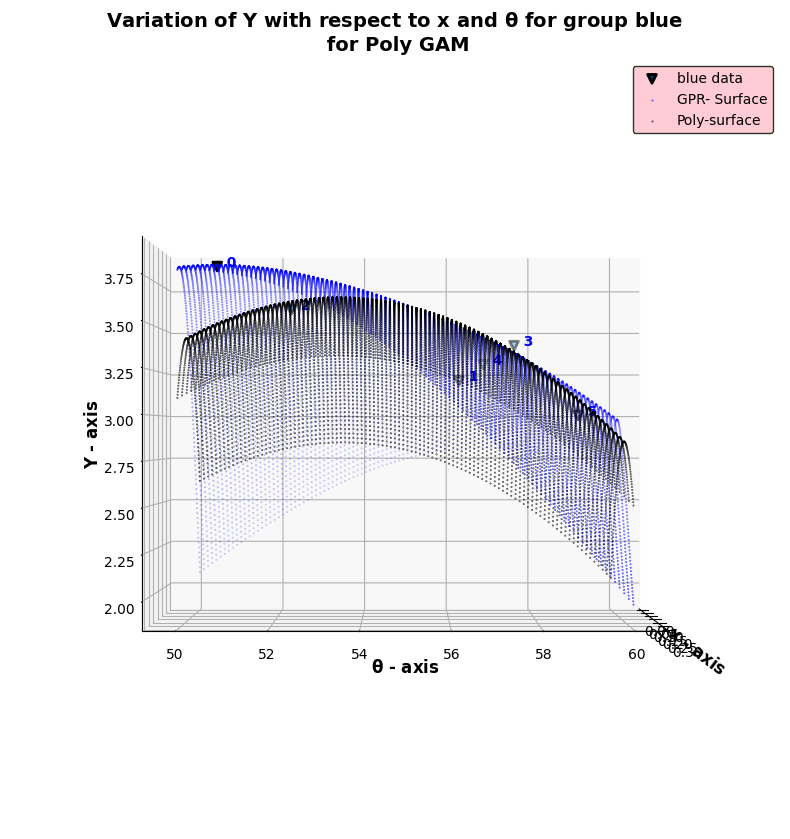

In [262]:
# Regression:
## [x^2,x,o^2,o,1]
matrixreg = np.hstack([xb_reg_scaled**2,xb_reg_scaled,ob_reg_scaled**2,ob_reg_scaled,ones_reg])
pinv_matrixreg = np.linalg.pinv(matrixreg)
coefficients = np.matmul(pinv_matrixreg,Yxob_reg) 
coefficients = coefficients.reshape(1,-1)[0]
a_poly_GAM,b_poly_GAM,c_poly_GAM,d_poly_GAM,e_poly_GAM = coefficients
Yxob_poly = (a_poly_GAM * xb_reg_scaled**2 
             +b_poly_GAM * xb_reg_scaled 
             + c_poly_GAM * ob_reg_scaled**2 
             + d_poly_GAM * ob_reg_scaled 
             + e*ones_reg)

# Visulaizing the GPR curves
fig = plt.figure(figsize=[10,10])
axs = fig.add_subplot(111,projection="3d")
axs.set_xlabel("$\mathbf{x}$ - axis", fontweight="bold",fontsize=12)
axs.set_ylabel("$\mathbf{\\theta}$ - axis", fontweight = "bold", fontsize=12)
axs.set_zlabel("$\mathbf{Y}$ - axis", fontweight="bold", fontsize=12)
axs.set_title("Variation of $\mathbf{Y}$ with respect to $\mathbf{x}$ and $\mathbf{\\theta}$ for group blue \n for Poly GAM",
              fontweight="bold",
              fontsize=14)

scatter = axs.scatter(xb,ob,Yb,c=Yb,  marker = "v", edgecolor="k",linewidth=2,s=40, cmap= "Blues",label= "blue data" )
for i, (x, o, Y) in enumerate(zip(xb, ob, Yb)):
    axs.text(x, o, Y, f'  {i}', color='blue', fontsize=10, fontweight='bold')

axs.scatter(xob_grid[:,0],xob_grid[:,1], Yxob_mean, c="blue", s = 0.1, label = "GPR- Surface")

axs.scatter(xb_reg,ob_reg, Yxob_poly, c="k", s = 0.1, alpha=1, label="Poly-surface")
legend = axs.legend(loc="best",facecolor="pink", edgecolor="black")
# cbar = fig.colorbar(scatter, ax=axs, shrink=0.5, aspect=15)
# cbar.set_label('Color Intensity', fontsize=12, fontweight='bold')


axs.view_init(elev=0., azim=0)


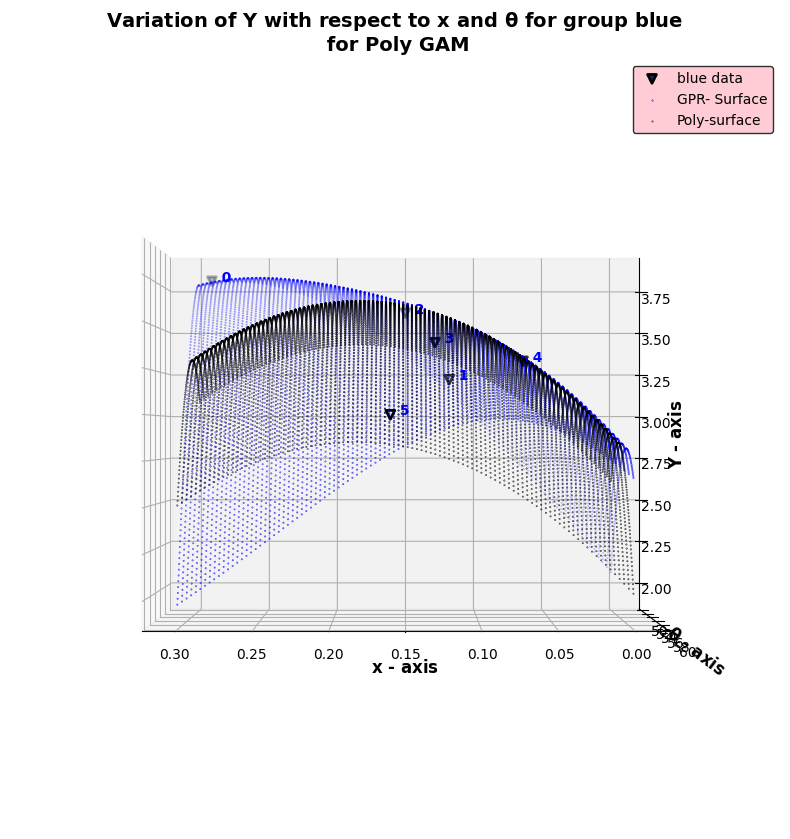

In [263]:
axs.view_init(elev=0., azim=90)
fig

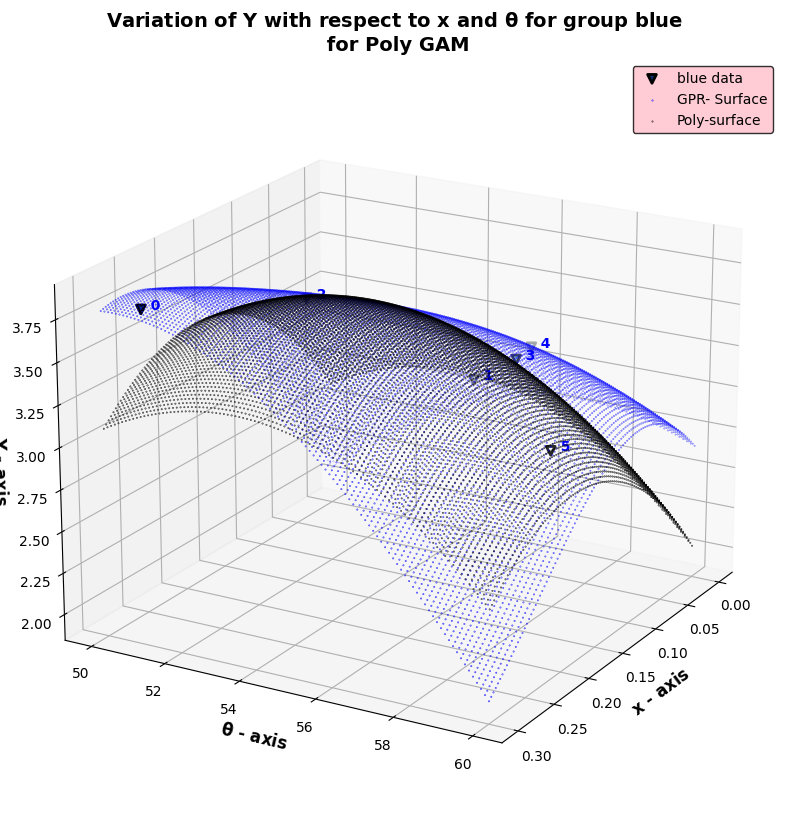

In [264]:
axs.view_init(elev=20,azim=30)
fig

# Error analysis between GPR_GAM and Poly_GAM

In [259]:
# Error for GPR_GAM
GPR_GAM_Error = np.linalg.norm(Yxob_GAM_GPR-Yxob_mean)/np.size(Yxob_mean)
# Error for Poly_GAM
Poly_GAM_Error = np.linalg.norm(Yxob_poly-Yxob_mean)/np.size(Yxob_mean)

print("Error while using Poly regression is ", Poly_GAM_Error)
print("Error while using GPR regression is ", GPR_GAM_Error)
print("This verifies (though not completely) the betterment of the method using the means")

Error while using Poly regression is  0.5016866065700746
Error while using GPR regression is  0.0023965423161319875
This verifies (though not completely) the betterment of the method using the means


# Visualizing individual functions

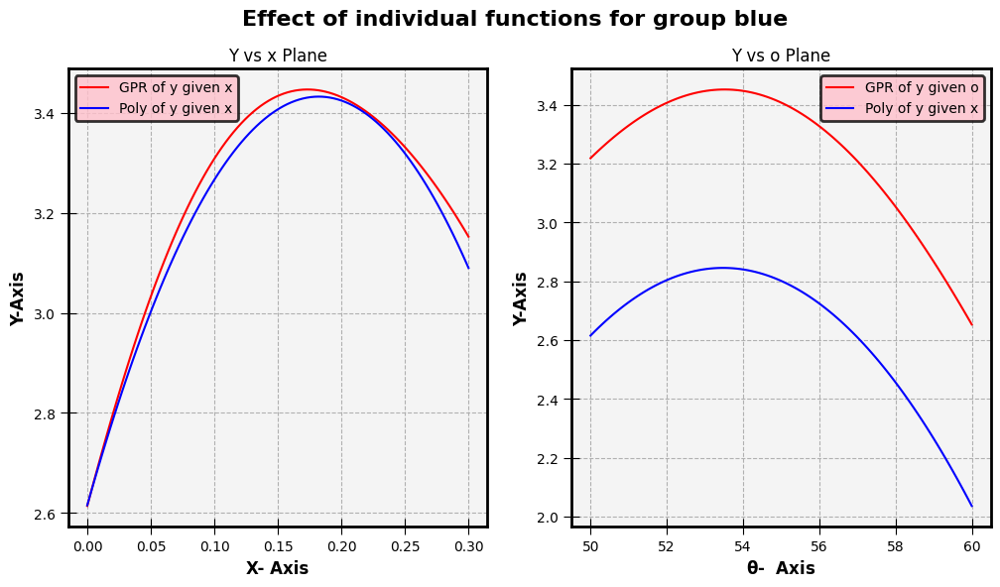

In [273]:
# Plotting 
## Usual Fig start
fig, axs = plt.subplots(1,2,figsize=[12,6])
axs[0].set_xlabel("X- Axis", fontweight="bold", fontsize=12)
axs[1].set_xlabel("$\mathbf{\\theta}$-  Axis", fontweight= "bold", fontsize="12")
fig.suptitle("Effect of individual functions for group blue",fontweight="bold",fontsize=16)
axs[0].set_title("Y vs x Plane")
axs[1].set_title("Y vs o Plane")

### Projecting the GPR curves
axs[0].plot(xb_points,gp_Yxb_mean.predict(xb_points_scaled),"r-",label="GPR of y given x")
### Projecting the GPR surface onto the ob-Axis
axs[1].plot(ob_points,gp_Yob_mean.predict(ob_points_scaled),"r-",label="GPR of y given o")
### Plotting the mean onto Y-xb plane
axs[0].plot(xb_points,a_poly_GAM*xb_points_scaled**2+b_poly_GAM*xb_points_scaled+e_poly_GAM,"b-",label="Poly of y given x")
### Plotting the mean onto Y-xb plane
axs[1].plot(ob_points,c_poly_GAM*ob_points_scaled**2+d_poly_GAM*ob_points_scaled+e_poly_GAM,"b-",label="Poly of y given x")
## Usual figure repetitive stuff
for i in [0,1]:
    axs[i].set_ylabel("Y-Axis", fontweight="bold", fontsize=12)
    axs[i].set_facecolor("#f4f4f4")
    axs[i].grid(True, linestyle="--")
    legend = axs[i].legend(loc="best",facecolor="pink",edgecolor="k")
    legend.get_frame().set_linewidth(2)
    axs[i].tick_params(direction="inout", size=12)
    for spine_value in axs[i].spines.keys():
        axs[i].spines[spine_value].set_linewidth(2)

## This explains why the 3d curves lmost look the same

## Initial Analysis of the data

### Plots
Let us observe if there is any pattern in the data with the following graphs.
We will plot 
- Hardening co-efficeint (Y) vs distance(x)
- Hardening co-efficeint (Y) vs misorientation angle (o)
- Yield strength (Y) vs distance(x)
- Yield strength (Y) vs misorientation angle (o).

Now Let us see how these plots look like.